<a href="https://colab.research.google.com/github/20014894UHI/20014894_Data_analytics_assignment1/blob/main/Dataanalytics_Assignment_Part1_Sheet_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Assignment 1 Sheet 1

## Introduction

### Frame the problem
We have been tasked by the emergency services of New York City to investigate the relationship between weather and the number of traffic collisions on a particular day. We want to predict the impact of collisions in New York based on weather conditions. The aim is to provide predictions that can aid in planning for emergency medical services. Analysis and predictions can provide insights for planning interventions to reduce the incidence of collisions.
We want to see if there is any predictable relationship that can aid planning to prevent and respond to collisions.

We want to build a linear regression model and a Deep Neural Network regression model that can predict the number of collisions on a particular day of the week and will allow them to optimise emergency response staff.


## Methodology

We will explore and analyse the data in this sheet and also clean the data.  In the next worksheet we will do analytics on the data using R and do some transformations.


Background reseach was carried out on the dataset with a view to a better  understanding of the collision data set. I researched to find other suitable datasets that could be combined to gain insights.  A [data dictionary](https://data.cityofnewyork.us/api/views/h9gi-nx95/files/bd7ab0b2-d48c-48c4-a0a5-590d31a3e120?download=true&filename=MVCollisionsDataDictionary_20190813_ERD.xlsx) and [official documents](https://data.cityofnewyork.us/Public-Safety/Motor-Vehicle-Collisions-Crashes/h9gi-nx95/data#) [submission rules](https://dmv.ny.gov/forms/p33.pdf)
provide insight into the data and recording methodology used.

This data examination and understanding phase was completed using Google BigQuery. The NYC collisions dataset has 28 fields and an aim was to determine fields that would be retained for pre-processing initial review.
I wanted to understand the significance of the fields. such as US specific concepts of on_street_names, off_street_names etc. I wanted to understand the data, extent of completenes and any anomalies and understand where there were inconsistencies that could impact the results. A detailed examination of contributing factors data was included.

There were some puzzles that stood out and that were investigated, e.g. what was the significance of the value ‘80’ for Contributing_factor_vehicle_1 (101 instances or .005%). Its frequency and non-randomness suggested it has some meaning. The information about the vehicles types involved and whether a 2nd vehicle was involved was assessed and found that it does not correlate particularly well. A null value may indicate no 2nd vehicle or no value recorded. The inconsistencies for the number of fatalities and injured were assessed and updates made with a view to ironing out inconsistencies.   
In 5,027 collisions, the individually recorded number_of_persons_injured is greater than the aggregate for the 3 injured categories and was less in 233 collisions.  An aim was to get a preliminary understanding of which data would be useful to carry forward to the next stage.
An examination of the completeness of location-based features incuded assessing the extent of the 0.0 latitude anomaly. Data cleaning steps were identified.
Where suitable, incorrect longitudes were replaced using 311 dataset.
Null borough values were updated where possible using the Borough Boundaries NYC Open Data data set.   
An aim was to retain data. I looked at various issues, including how to impute Boroughs for missing Boroughs, location information etc.
Analysis was completed to resolve and understand a lot of anomalies in the data, with the aim of retaining as much usable data as possible for exporting for analysis.

## Data collection, pre-processing and understanding

## Datasets used
-	New York City Collisions
> The Motor Vehicle Collisions data tables contain information from all police reported motor vehicle collisions in NYC. The dataset currently has 1,970,998 collision records.
-	US Zip codes
-	[Borough Boundaries NYC Open Data dataset](https://data.cityofnewyork.us/City-Government/Borough-Boundaries/tqmj-j8zm)
-	[City of New York, 311 Service Requests](https://data.cityofnewyork.us/Social-Services/311-Service-Requests-from-2010-to-Present/erm2-nwe9)



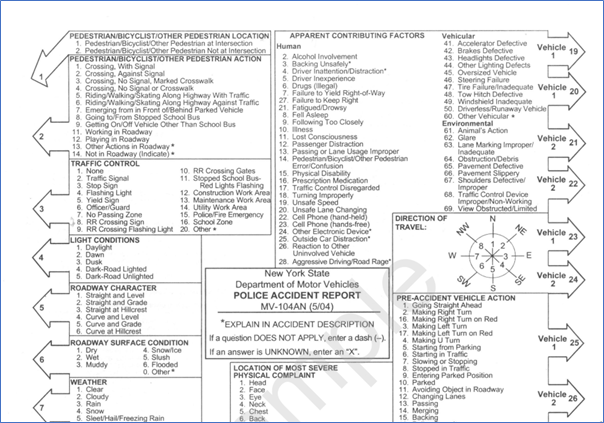

Fix again [link text](https://)Figure 1: Police accident report form MV-104

## Extract the first collision dataset integrating some pre-processing steps
The initial dataset was created. Although presented at the top, this integrates many of the updates and changes that arose as a result of iterative analysis/examination. Transformation and other cleaning/sanitizing  steps were added to this in order to have a repeatable sequence for regenerating the dataset.
The steps in this section were very much completed in an iterative fashion, with adjustments each round.
For example in earlier rounds we cut-off the data at the end of 2022. In the latest iteration, we included available data for 2023. There was a dramatic decline in collisions and an overall more dense, concentrated and lower and smaller band range evident from 2020 on in the Exploratory Data Analysis phase using R. We included data from 2023 to see if this was a temporary reduction due to the Covid19 pandemic and reduction in public transport.

In [ ]:
# Select the data for exporting - this is round 1 and includes some data cleaning */
CREATE TABLE `Assignment1DS.nypd_mv_collisions` AS
SELECT unique_key, timestamp,
      trim(upper(borough)) as borough,
      null as borough_from_311, -- placeholder for later update from 311 dataset
      (IF (upper(contributing_factor_vehicle_1) = 'UNSPECIFIED' or contributing_factor_vehicle_1='80'or contributing_factor_vehicle_1='0' or contributing_factor_vehicle_1='1',      null, upper(contributing_factor_vehicle_1)))
        AS contributing_factor_vehicle_1,
      (IF (upper(contributing_factor_vehicle_2) = 'UNSPECIFIED' or contributing_factor_vehicle_2='80'or contributing_factor_vehicle_2='0' or                contributing_factor_vehicle_2='1', null, upper(contributing_factor_vehicle_2)))
        AS contributing_factor_vehicle_2,
        -- many equivalent items with variants of case 'Cell phone (hand-held)'' etc.
        -- 'Unspecified' and the invalid values of ‘80’ and ‘1’ will be combined and treated as missing.
      # upper(contributing_factor_vehicle_3), Upper(contributing_factor_vehicle_4), upper(contributing_factor_vehicle_5), -- Disregard these
      # almost exclusively null or null-like values (from 98% upwards) and noise.
      trim(upper(cross_street_name)) as cross_street_name, trim(upper(off_street_name)) as off_street_name, trim(upper(on_street_name)) as on_street_name,
      (IF (latitude=0.0, null, latitude)) AS latitude, -- 0.0 is invalid -- affects 4016 records
      (IF (longitude=0.0, null, longitude)) AS longitude, -- 0.0 is invalid -- affects 4016
      (IF (longitude=0.0 and latitude=0.0, null, location)) AS location,
      (IF (zip_code=10000, null, zip_code)) AS zip_code, -- 388 instances - validity based on zip_codes dataset
      # Number of injured and fatalities
      # Don't always match up properly, so set the number of injured persons to injured cyclists + injured motorists + pedestrians where
      # persons injured is less than the total for the 3 categories'
      (IF (number_of_persons_injured < (number_of_cyclist_injured + number_of_motorist_injured + number_of_pedestrians_injured), (number_of_cyclist_injured + number_of_motorist_injured + number_of_pedestrians_injured), number_of_persons_injured)) AS number_of_persons_injured, --
      # assume that the truth for fatalites is the aggregate of the individual fatality categories when their total is greater than the number_of_persons_killed (6 collisions). Update number_of_persons_killed to summed for these.
      (IF (number_of_persons_killed < (number_of_cyclist_killed + number_of_motorist_killed + number_of_pedestrians_killed), (number_of_cyclist_killed + number_of_motorist_killed + number_of_pedestrians_killed), number_of_persons_killed)) AS number_of_persons_killed,
      # number_of_cyclist_injured, number_of_cyclist_killed, number_of_motorist_injured, number_of_motorist_killed,
      # number_of_pedestrians_killed,number_of_pedestrians_injured, number_of_persons_killed,number_of_persons_injured,
      --- Fatalities + weighted injuries
      ## 0.0 as fatalities_w_injuries, --- PLaceholder for fatalities and weighted injuries - Calc below instead
      (IF (number_of_persons_killed >= 0 OR number_of_persons_injured >= 0, number_of_persons_killed + (number_of_persons_injured * .1), 0.0)) as weighted_fatalities_injuries,
       trim(upper(vehicle_type_code1)) AS vehicle_type_code1, trim(upper(vehicle_type_code2)) as vehicle_type_code2,
       # upper(vehicle_type_code_3), upper(vehicle_type_code_4),upper(vehicle_type_code_5) -- disregard
      -- Count the num vehicles involved as vehicle type code and vehicle contributing factors don't correlate well
      (CASE WHEN vehicle_type_code1 IS NOT NULL THEN 1 ELSE 0 END +
       CASE WHEN vehicle_type_code2 IS NOT NULL THEN 1 ELSE 0 END +
       CASE WHEN vehicle_type_code_3 IS NOT NULL THEN 1 ELSE 0 END +
       CASE WHEN vehicle_type_code_4 IS NOT NULL THEN 1 ELSE 0 END +
       CASE WHEN vehicle_type_code_5 IS NOT NULL THEN 1 ELSE 0 END) as num_vehicles_involved
FROM `bigquery-public-data.new_york_mv_collisions.nypd_mv_collisions`
##Where EXTRACT(YEAR FROM timestamp) < 2023

The following is an example of the data.

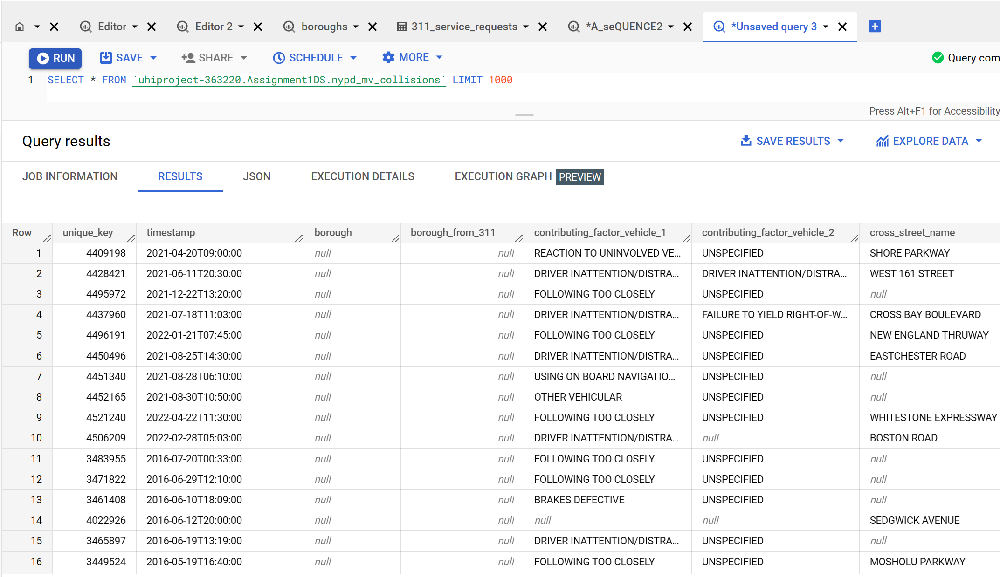

## Analysis and gaining an understanding the data using Google BigQuery

### Contributing factors for vehicles 1 - 5
The contributing factor fields stood out as being potentially of special interest for the study and were assessed for fit for purpose and reliability.


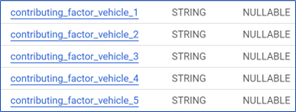

#### Missing and unusable values for contributing_factors_vehicle_1

Initially, the value ‘80’ for **Contributing_factor_vehicle_1** (101 instances or .005%) stood out. Its frequency (80) as both a contributing factor for vehicle 1 and 2 and a certain non-randomness - ‘1’ is the only other number-like value for the field - suggested it has some meaning. Its frequency was peculiarly higher than some other factors that would be associated generally with a risk of collision e.g. some cited in a study in 2022 (Akin, 2022). It does not correspond to an item numbered ‘80’ in the [Police Accident
Report Form](https://www.nhtsa.gov/sites/nhtsa.dot.gov/files/documents/ny_overlay_mv-104an_rev05_2004.pdf). It could be a convention used though not evident in the form instructions or it could be an accidental or intended transformation/processing. Whatever origin or meaning it had is now lost and it is unusable for our purposes.

**Since a collision has to have a contributing factor, these ‘80’ and ‘1’ values were updated to null in the data extraction step presented at the outset.**

Earlier, 'unspecified' values and the invalid values of '‘80’ and ‘1’ were  combined and treated as missing - and updated to null in the step to extract the initial dataset.

In [ ]:
# Highlight Unspecified, peculiar 80 and 1
With contributingfactorsvehicle1 as
(Select contributing_factor_vehicle_1,
      count (*) as count_of_factor,
      round(count(*) * 100 / sum(count(*)) over(),3) as percent_of_total
       from `bigquery-public-data.new_york_mv_collisions.nypd_mv_collisions`
      group by contributing_factor_vehicle_1
      order by percent_of_total desc)
Select contributing_factor_vehicle_1, count_of_factor, percent_of_total from contributingfactorsvehicle1
where
     # Highlight Unspecified, 80 and 1
      contributing_factor_vehicle_1 = 'Unspecified' or
      contributing_factor_vehicle_1 = '80'or
      contributing_factor_vehicle_1 = '1' or
      contributing_factor_vehicle_1 is null

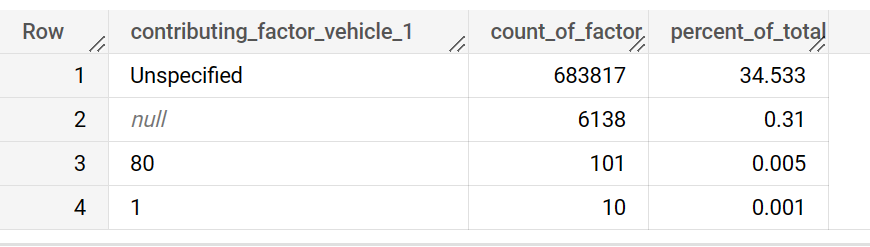

Figure: Null or null-like or meaningless values for contributing factors for vehicle 1.

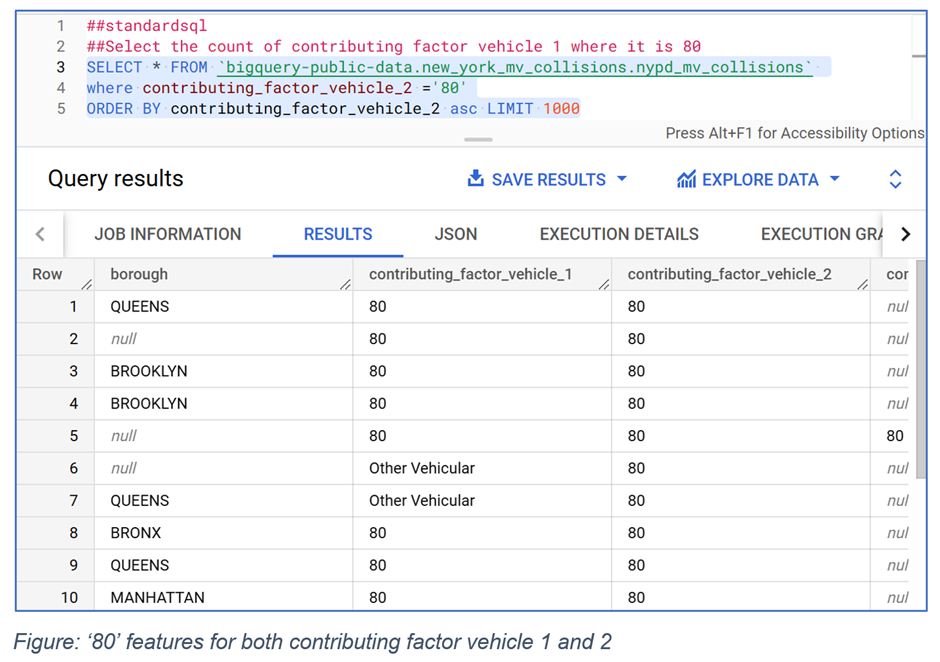

'80' features for both as a contributing factor for both vehicle 1 and 2.
The feature that is closest to the root cause of collision is of most relevance – i.e. the factors for vehicle 1 and 2.

#### Unique values for contributing factors and merging values
There were 62 unique values for **Contributing_factor_vehicle_1** initially.
Resolving the 'Ilnes' typo (1495 affected), merging the 'uninvolved' vehicle items and filtering with case insensitivity reduced it to 56.
The count for each factor and its percentage of the total was extracted as a view.  

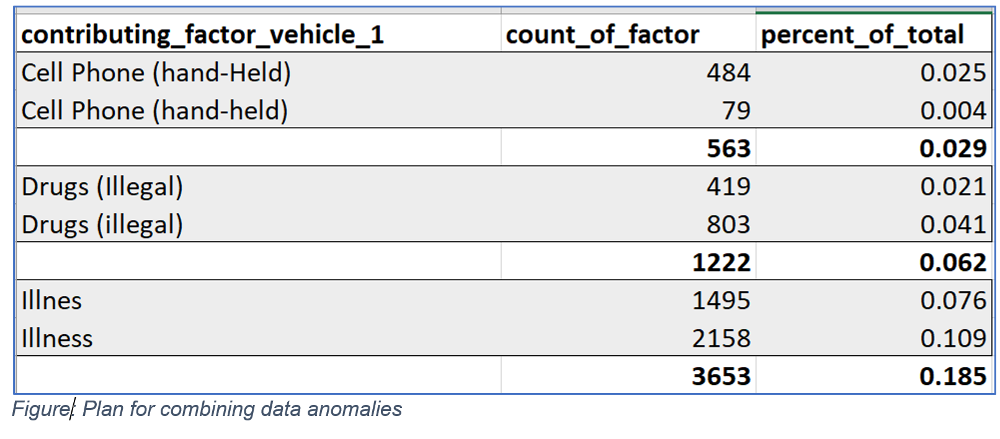

#### QUERY 2

In [ ]:
# Data cleaning for 'Ilnes' typo and merging uninvolved vehicle items -- UPDATES 1474
# Query 2
#UPDATE `uhiproject-363220.Assignment1DS.nypd_mv_collisions`
#set contributing_factor_vehicle_1 = 'ILLNESS' wHere contributing_factor_vehicle_1 = 'ILLNES'
UPDATE `uhiproject-363220.Assignment1DS.nypd_mv_collisions`
set contributing_factor_vehicle_1 = 'ILLNESS' wHere contributing_factor_vehicle_1 = 'ILLNES' -- UPDATES 1474 / 1516 for up to '23.

# Data cleaning for 'Uninvolved vehicle' /merging uninvolved vehicle items -- UPDATES 1337 Records
UPDATE `uhiproject-363220.Assignment1DS.nypd_mv_collisions`
set contributing_factor_vehicle_1 = 'REACTION TO UNINVOLVED VEHICLE'
wHere contributing_factor_vehicle_1 = 'REACTION TO OTHER UNINVOLVED VEHICLE' --
#--CELL PHONE (HAND-HELD) - could also be equivalent to texting

# uNIQUE CONTRIBUTING FACTORS VEHICLE 1
CREATE VIEW `uhiproject-363220.Assignment1DS.contributing_factors_vehicle_1` AS SELECT
      contributing_factor_vehicle_1,
      count(*) as count_of_factor,
      round(count(*) * 100 / sum(count(*)) over(),3) as percent_of_total
      #from `bigquery-public-data.new_york_mv_collisions.nypd_mv_collisions`
      FROM `uhiproject-363220.Assignment1DS.nypd_mv_collisions`
      group by contributing_factor_vehicle_1
      order by contributing_factor_vehicle_1 asc
#
select * from  `uhiproject-363220.Assignment1DS.contributing_factors_vehicle_1`


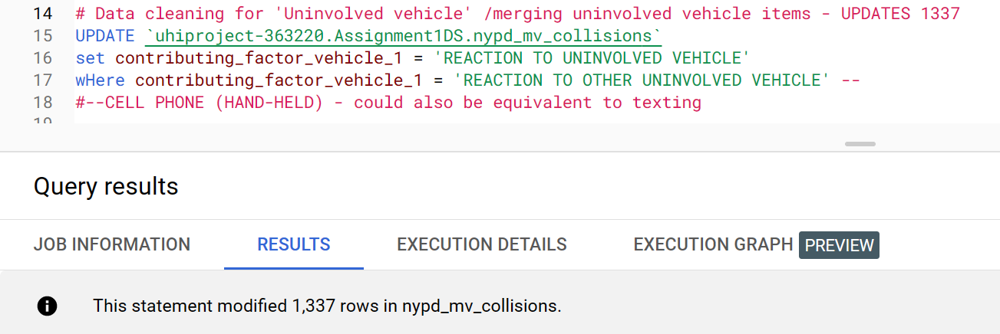

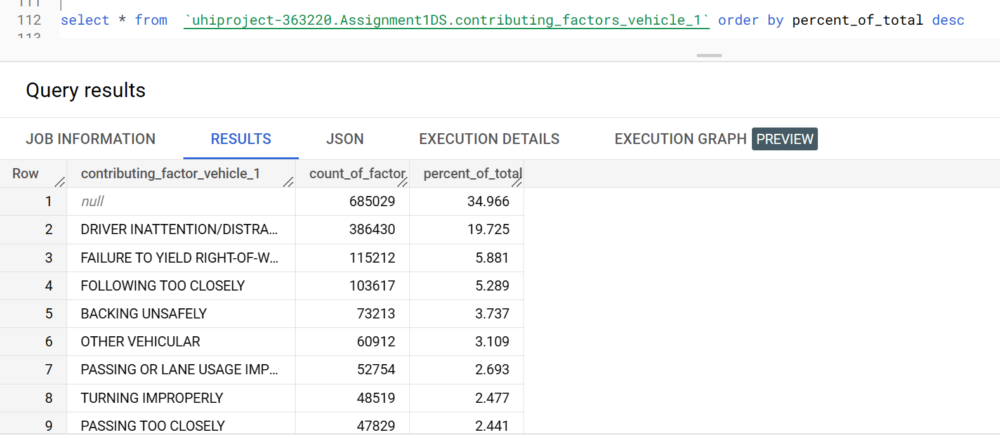

The completeness of the data decreases after vehicle 1 with its high of 35% of null-like (having converted 'Unspecified' to null in the initial extraction). The [submission rules](https://dmv.ny.gov/forms/p33.pdf) state that all crashes must have at least 1 contributing factor (p36).



In [ ]:
# contributing factors vehicle 2 values and frequency
select contributing_factor_vehicle_2, count(*)
       #from `bigquery-public-data.new_york_mv_collisions.nypd_mv_collisions`
       FROM `uhiproject-363220.Assignment1DS.nypd_mv_collisions`
group by contributing_factor_vehicle_2
order by count(*) desc

####**Contributing factor for vehicle 2**

Unspecified values were set to null likewise for ***contributing_factors_vehicle_2***.

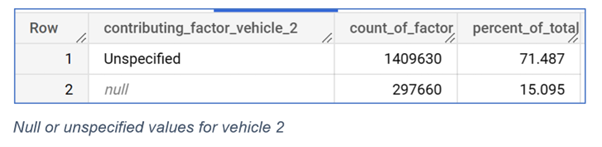

`Contributing_factor_vehicle_2` has predominantly non useful data (null and previously 'Unspecified', now null data) and we will not export its values for the initial dataset.
***Values for vehicle 2 will be retained in the initial export. ***

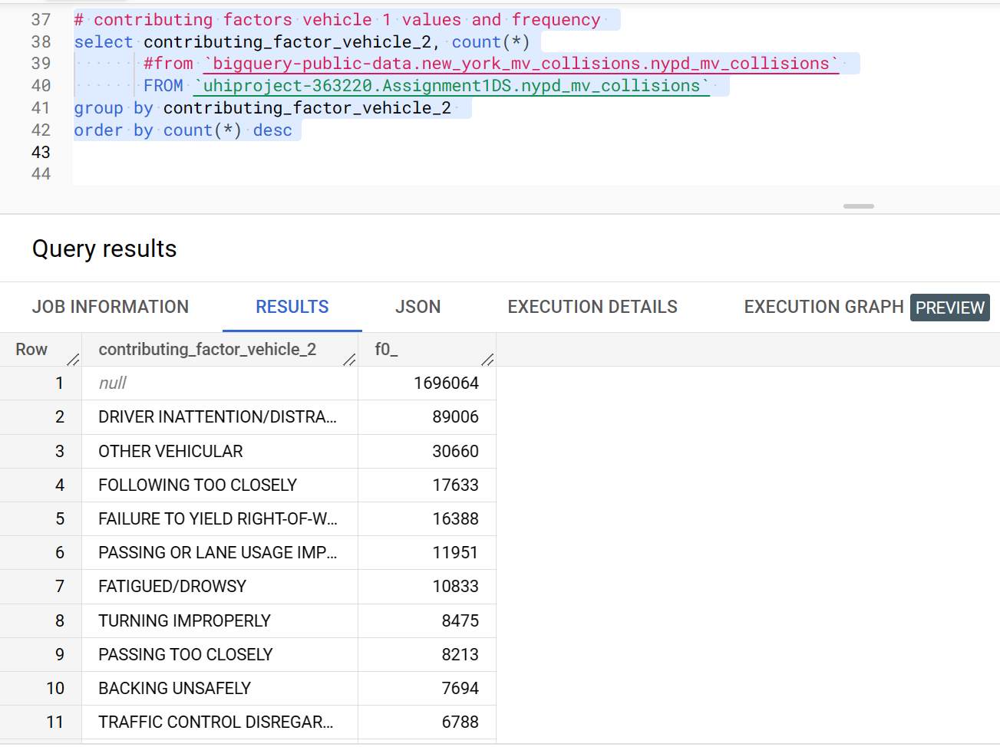

#### **Contributing factors for vehicles 3, 4 and 5**
The contributing factors for vehicles 3, 4 and 5 have almost exclusively null or null-like values (from 98% upwards) and noise. The data available for these fields is not sufficient.
As a result, values for columns 3,4 and 5 were not included in the initial dataset exported.
Sufficient data for contributing factors could lead to insights relating to environmental (e.g. weather related causes). E.g. in scenario where a contributing weather related factors were recorded for several involved vehicles in a collision that correlates with cold temperatures/ icy conditions.


  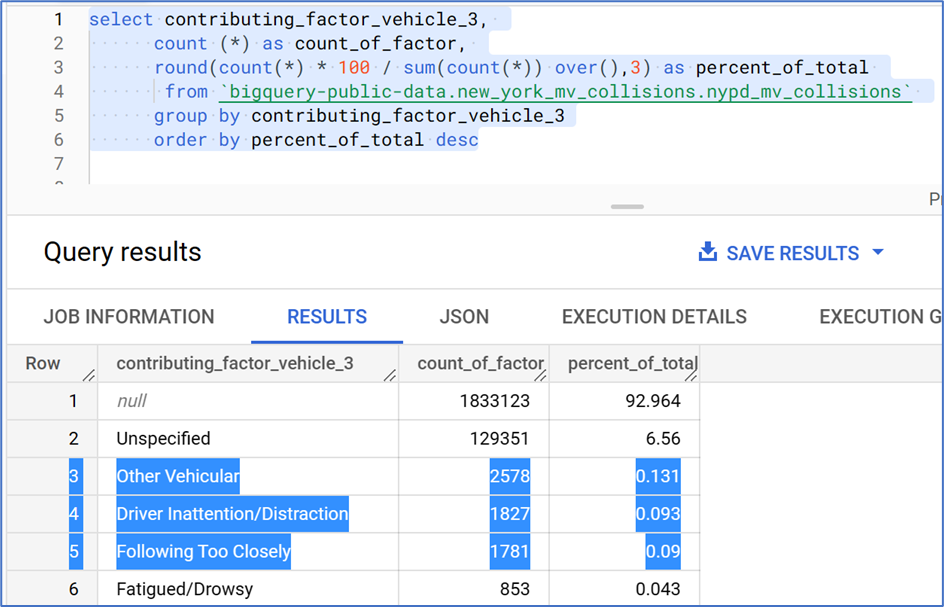

Figure: Null or unspecified values for vehicle 3, 4 and 5

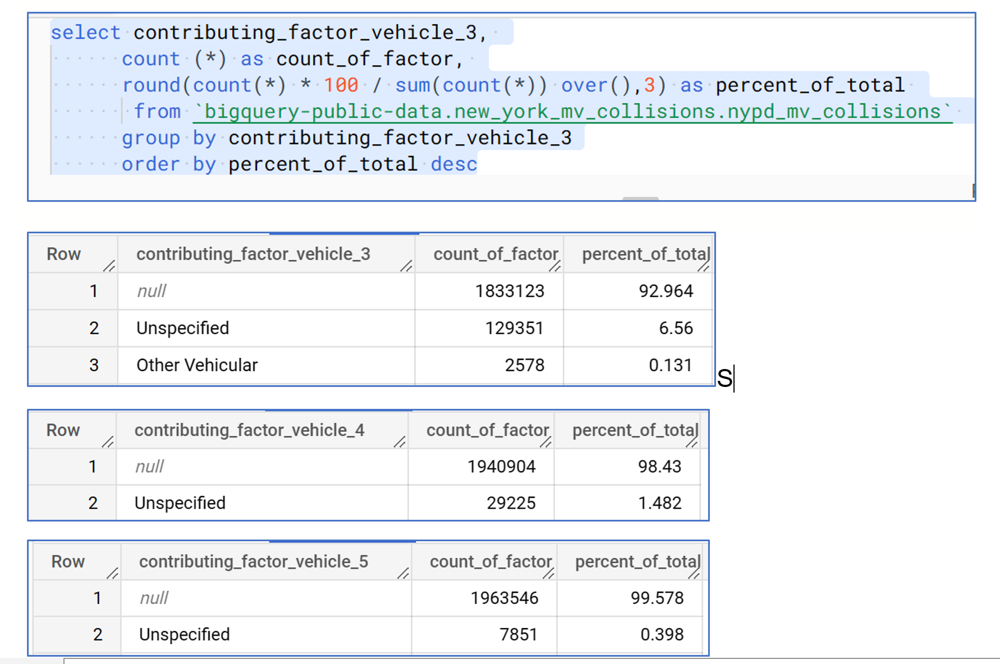

#### **Further groupings for contributing factors for vehicles**
A list of potential categories was considered to group the factors. These are:
*	Vehicle or mechanical factors
* Alcohol/Drugs/Medication
* Driving behaviour/quality/standards
* Electronic devices
* Distraction/inattention
* Tiredness – group together due to significance of awareness campaigns and signage such as ‘Tiredness kills’  
* Glare – due to significance for weather
The original specific factor will be retained also.


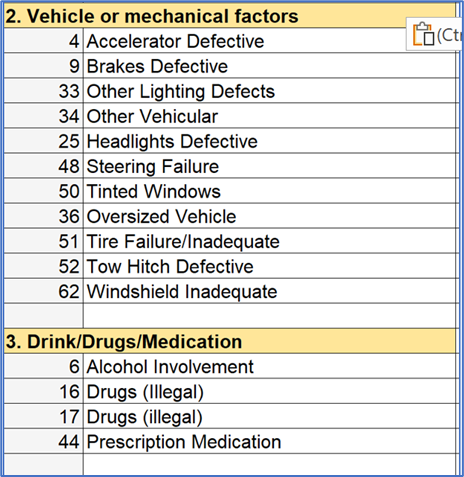

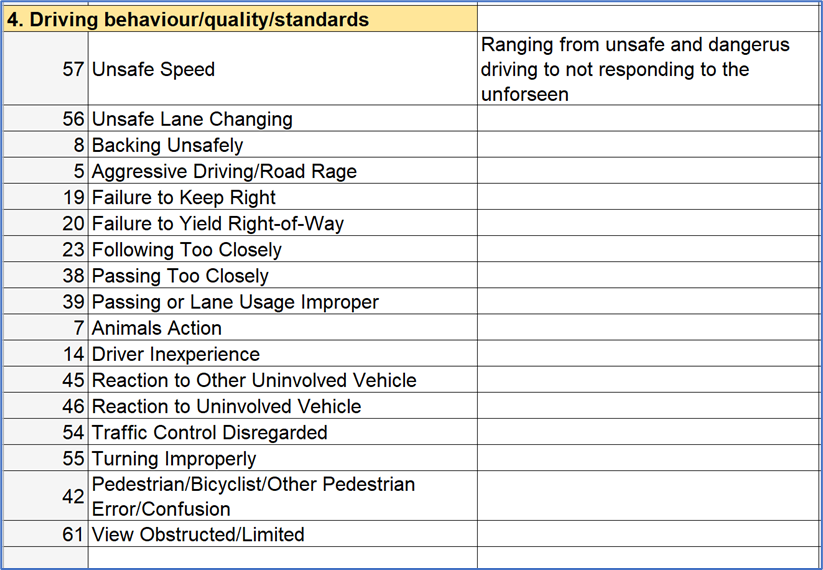

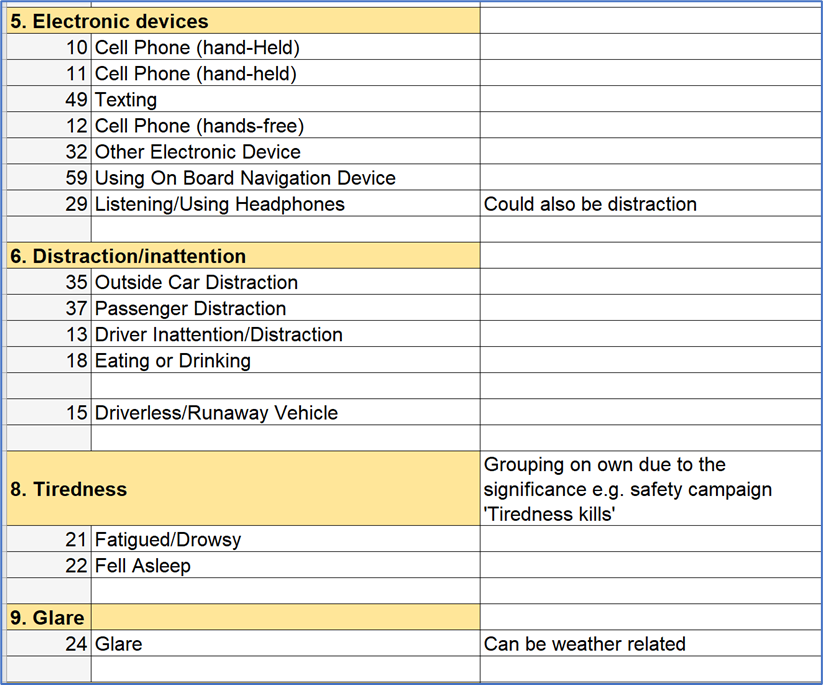
Figure: Plan for grouping contributing factors

We note that in the Police Report form they are grouped into 3 broad categories: human, environmental and vehicular. Comparing the two approaches to categorization highlights potential for bias, e.g. I had classified ‘Animal’s action’ as related to driving behaviour in terms of being able to respond to the unexpected, yet a large out-of-control animal intent on ramming a vehicle may well be environmental. An Irish-based study divides factors into Pedestrian, Driver, Road, Environment and Vehicle (NRA, 2012).

There is scope also for collapsing the data into these 3 broader categories as in the Police Report form.

### **Inconsistencies -  vehicle type and vehicle contributing factors does not tally**

At first glance it could be expected that the Information about the vehicle types and vehicle contributing factors would tally. Yet information about the vehicle type involved and whether a 2nd vehicle was involved does not correlate particularly well. A null value may indicate no 2nd vehicle or no value recorded.

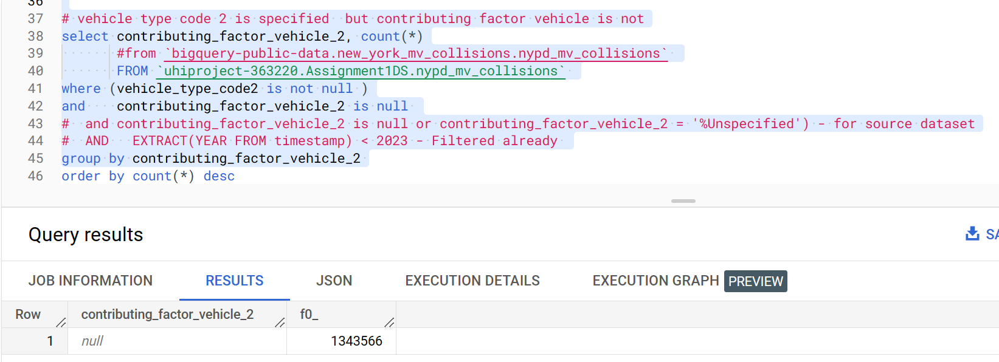

Of the 1.6m cases where a 2nd involved vehicle was recorded (non-null
`vehicle_type_code2` -shown below), the contributing factor for vehicle 2 was not (i.e. was either null or originally ‘Unspecified’ in 1.34M of these.  


In [ ]:
# cases where a 2nd involved vehicle was recorded (non-null vehicle_type_code2)
# vehicle type code 2 values and frequency
select count(*)
       #from `bigquery-public-data.new_york_mv_collisions.nypd_mv_collisions`
       FROM `uhiproject-363220.Assignment1DS.nypd_mv_collisions`
where (vehicle_type_code2 is not null )

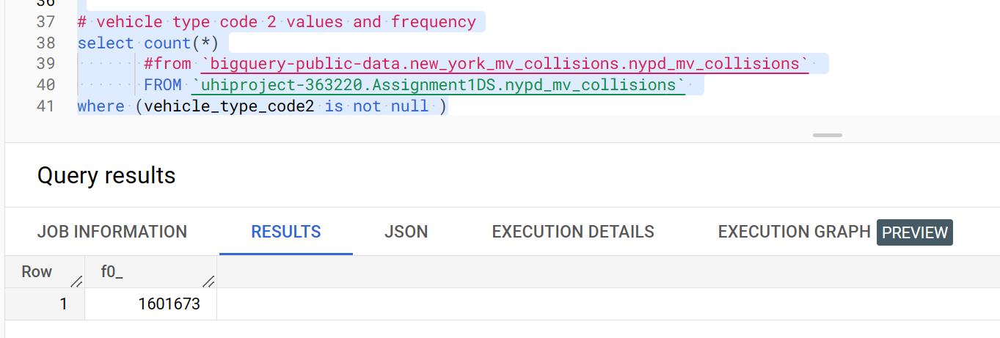

In [ ]:
# vehicle type code 2 is specified  but contributing factor vehicle is not
select contributing_factor_vehicle_2, count(*)
       #from `bigquery-public-data.new_york_mv_collisions.nypd_mv_collisions`
       FROM `uhiproject-363220.Assignment1DS.nypd_mv_collisions`
where (vehicle_type_code2 is not null )
and    contributing_factor_vehicle_2 is null
#  and contributing_factor_vehicle_2 is null or contributing_factor_vehicle_2 = '%Unspecified') - for source dataset
#  AND   EXTRACT(YEAR FROM timestamp) < 2023 - Filtered already
group by contributing_factor_vehicle_2

#### **Adjustments for insconsistencies in the number of fatalities and injured**  
In 5,027 collisions, the individually recorded **`number_of_persons_injured`** is greater than the aggregate for the 3 injured categories and was less in 233 collisions.  

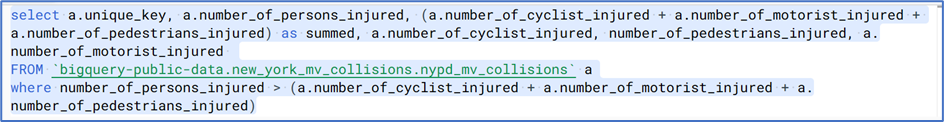

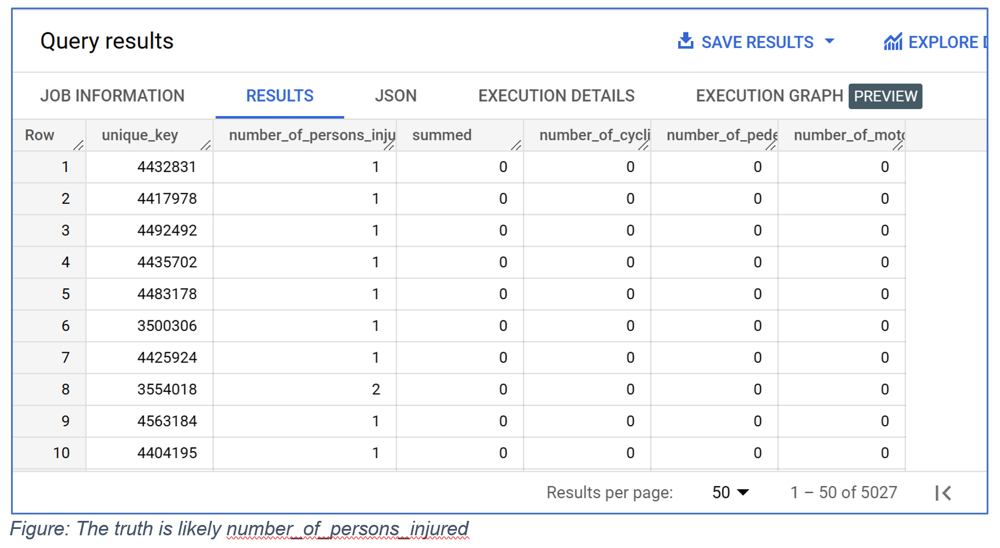

I consider that the individually recorded figure for **`number_of_persons_injured`**  is the most reliable where it is both positive and greater than the aggregate value.
In this case, no update action will be taken.  
Conversely, the individual amounts are the most reliable when they are positive and greater than the recorded **`number_of_persons_injured`**.
In this case, the aggregate (summed below) will be inserted into  **`number_of_persons_injured`** to correct it.


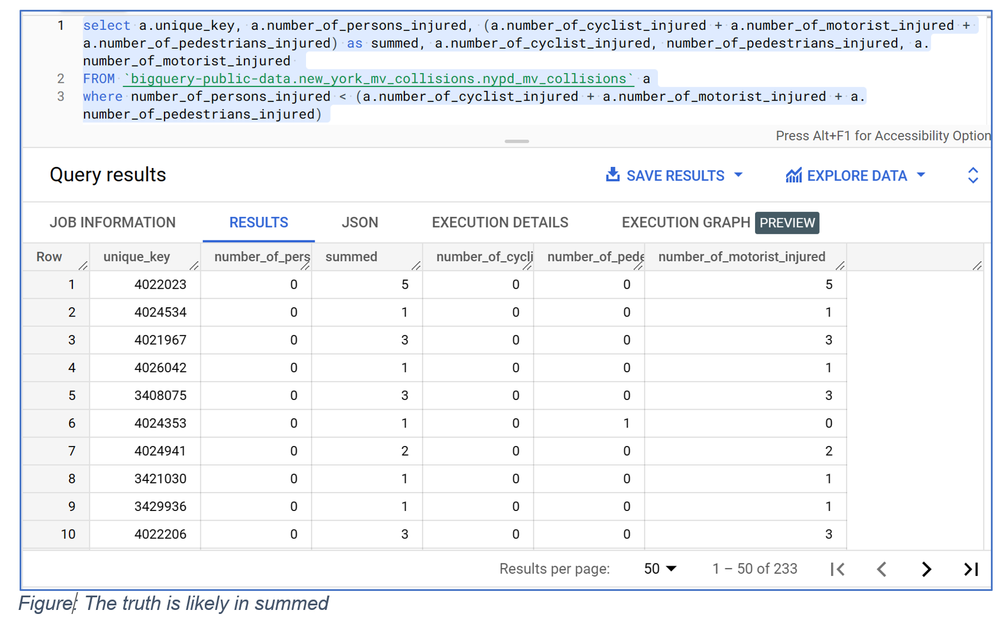

The aggregation step below was instead integrated in the query presented at the outset that generates the initial dataset and is relevant for 233 rows.

In [ ]:
# Alternative use in the query for data extraction in later iteration
# Number of injured and fatalities
# Don't always match up properly, so set the number of injured persons to injured cyclists + injured motorists + pedestrians where
# persons injured is less than the total for the 3 categories'
SELECT [...]
(IF (number_of_persons_injured < (number_of_cyclist_injured +
                                  number_of_motorist_injured +
                                  number_of_pedestrians_injured),
     (number_of_cyclist_injured + number_of_motorist_injured + number_of_pedestrians_injured), number_of_persons_injured)) AS number_of_persons_injured, --
# assume that the truth for fatalites is the aggregate of the individual fatality categories when their total is greater than the number_of_persons_killed (6 collisions). Update number_of_persons_killed to summed for these.
(IF (number_of_persons_killed < (number_of_cyclist_killed + number_of_motorist_killed + number_of_pedestrians_killed),
     (number_of_cyclist_killed + number_of_motorist_killed + number_of_pedestrians_killed), number_of_persons_killed)) AS number_of_persons_killed,

# Update alternative initially used
# Set the number of injured persons to injured cyclists + injured motorists + pedestrians where
# persons injured is less than the total for the 3 categories'
update `uhiproject-363220.Assignment1DS.nypd_mv_collisions` a
set number_of_persons_injured =
    (a.number_of_cyclist_injured + a.number_of_motorist_injured + a.number_of_pedestrians_injured)
where
    number_of_persons_injured < (a.number_of_cyclist_injured + a.number_of_motorist_injured + a.number_of_pedestrians_injured)



I apply the same logic to the fatalities, assuming that the correct data for fatalites is the aggregate of the individual fatality categories when their total is greater than the **`number_of_persons_killed`** (6 collisions). I will update **`number_of_persons_killed`** to summed for these.
This update was also moved to the step to generate the initial set in a later iteration.

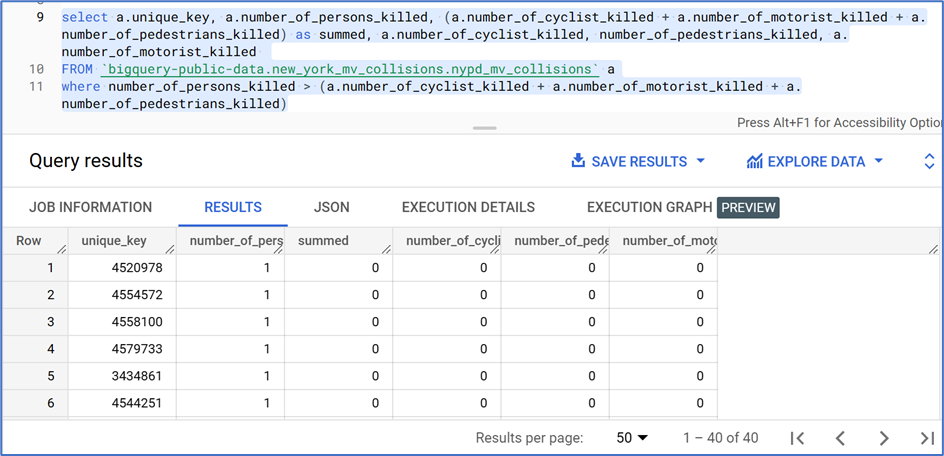

In [ ]:
# Set the number of fatalities to fatalities for cyclists + motorists + pedestrians where
# persons killed is less than the total for the 3 categories'
update `uhiproject-363220.Assignment1DS.nypd_mv_collisions` a
set number_of_persons_killed = (a.number_of_cyclist_killed + a.number_of_motorist_killed + a.number_of_pedestrians_killed)
where number_of_persons_killed < (a.number_of_cyclist_killed + a.number_of_motorist_killed + a.number_of_pedestrians_killed)


I will assume the **`number_of_persons_killed`** is correct when it is positive and greater than the sum of the 3 fatality groups (40 collisions). No update was made.

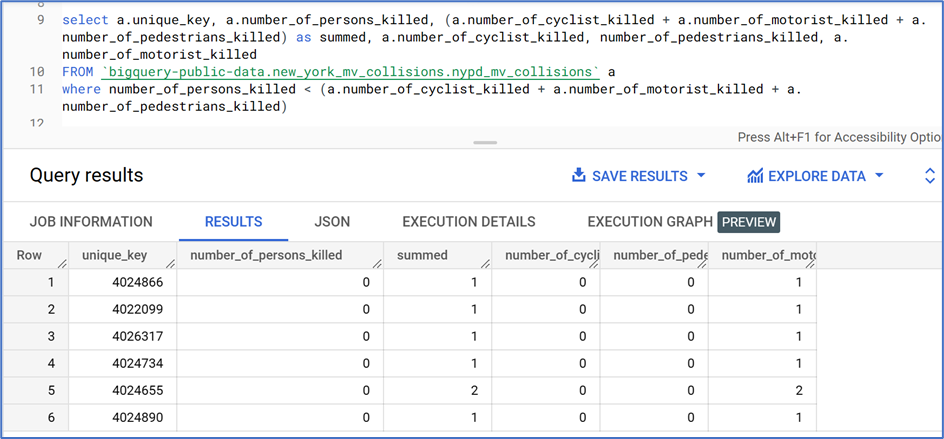

***I viewed this option as better than deleting 5000+ records and believe it maintains the data integrity.***

We will exclude these fields as the overall figures indicate collisions/injuries.  
* number_of_cyclist_injured
* number_of_cyclist_killed
* number_motorist_injured
* number_motorist_killed
* number_of_pedestrians_killed
* number_of_pedestrians_injured


In a later iteration, as I only extracted the overall data for fatalities and injuries to the initial dataset, I did not need to drop these columns.

In [ ]:
# Remove the category columns for numbers of fatalities and injured - using totals instead
alter table  `uhiproject-363220.Assignment1DS.nypd_mv_collisions`
drop  column number_of_cyclist_killed,
drop column number_of_motorist_killed,
drop column number_of_pedestrians_killed,
drop column number_of_cyclist_injured,
drop column number_of_motorist_injured,
drop column number_of_pedestrians_injured

### **Fatalities and weighted injuries as a measure of average collision severity**
Road safety statistics are often based on an analysis of fatalities or KSIs (killed and seriously injured). Though the crash report form provides for a lot of detail on injuries, this does not translate to the dataset, likely for privacy and anonymisation reasons. The data recorded is the number injured and killed for each collision.

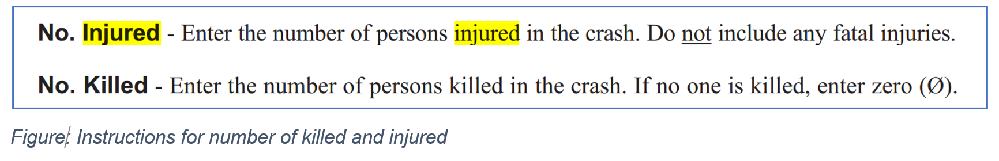

The concept of **Fatalities plus Weighted Injuries** (FWI) is sometimes used to include a combined measure of the overall severity of a collision and is defined as:
FWI = Fatalities + (0.1 x serious injuries) + (0.01 x minor injuries) (Risk Solutions, 2012). As we have no data on the severity of injuries, we will include an adapted concept of fatalities plus injuries as follows: **FI = Fatalities + (0.1 x injuries)**.
This was initially done using an update query.  Subsequently the calculation was integrated into the query to extract the data.

In [ ]:
# Later method - apply the calculation in the intial dataset extracted
SELECT [..]
  (IF (number_of_persons_killed >= 0 OR number_of_persons_injured >= 0, number_of_persons_killed + (number_of_persons_injured * .1), 0.0)) as weighted_fatalities_injuries,
     upper(vehicle_type_code1) AS vehicle_type_code1, upper(vehicle_type_code2) as vehicle_type_code2,
[...]
# Initial method - alter the table and update the fatalities and weighted injuries to fatalities + (injuries * .1)
update `uhiproject-363220.Assignment1DS.nypd_mv_collisions`
set     fatalities_w_injuries = number_of_persons_killed + (number_of_persons_injured * .1)
where   number_of_persons_killed >= 0 AND number_of_persons_injured >= 0


### **Considerations in relation to vehicle type codes**

Number of vehicles involved using vehicle type codes

#### **1499 unique values for vehicle type code 1**

There are 1,499 unique values with duplicates and would need time consuming cleaning work for analysis. It includes a few unexpected values such as ‘House', 'skateboard'. These are entered in free-text making them difficult to classify. There are typos and there is no standard set of values. Some values are car makes such as Toyota, Chevrolet, John Deere. If we do some data cleaning and attempt to amalgate the values somewhat - it may be possible to get insights into the most implicated vehicle types.

  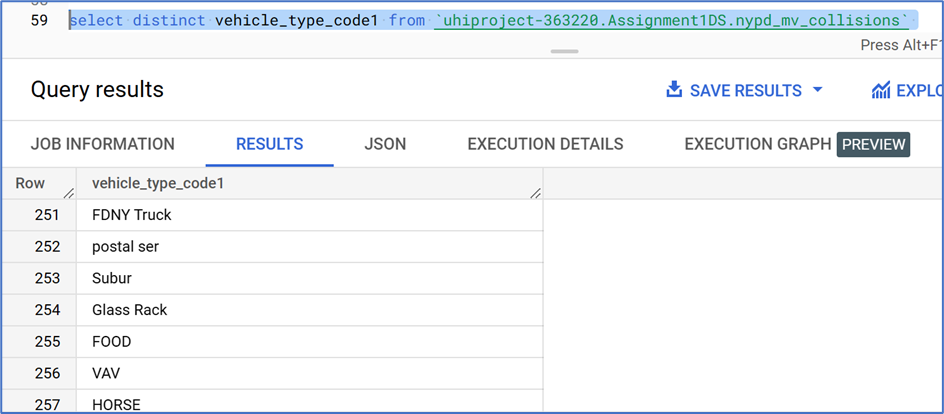

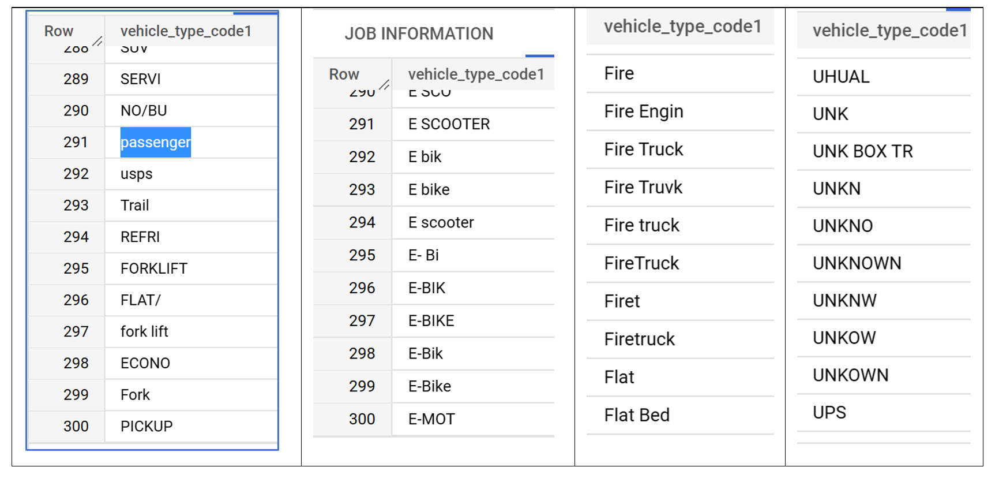

#### **Most frequently involved vehicle types for vehicle 1 before cleaning the data to amalgamate the vehicle types**

The result below shows the most frequent values for `vehicle_type_code1`.

We then ran some cleaning queries to amalgamate and clean the data somewhat.

In [ ]:

update `uhiproject-363220.Assignment1DS.nypd_mv_collisions` set vehicle_type_code1 = 'UNKNOWN' WHERE vehicle_type_code1 = 'UNKNO' OR vehicle_type_code1 = 'UNK' OR vehicle_type_code1 = 'UKN' OR vehicle_type_code1 = 'UNKN' OR vehicle_type_code1 = 'UNKNW' OR vehicle_type_code1 = 'UNKOW' OR vehicle_type_code1 = 'UNKOWN' OR vehicle_type_code1 = 'UNKNW' OR vehicle_type_code1 = 'UNK*'
#161 rows

update `uhiproject-363220.Assignment1DS.nypd_mv_collisions` set vehicle_type_code1 = 'UHAUL' WHERE vehicle_type_code1 = 'UHUAL' OR vehicle_type_code1 = 'UHAL' OR vehicle_type_code1 LIKE '%U-HAU%' OR vehicle_type_code1 = 'U HAUL TRU' OR vehicle_type_code1 = 'U-HAL' OR vehicle_type_code1 = 'U HAU'#13 ROWS

update `uhiproject-363220.Assignment1DS.nypd_mv_collisions` set vehicle_type_code1 = 'TAXI OR LIVERY VEHICLE' WHERE vehicle_type_code1 = 'YELLOW CAB' OR vehicle_type_code1 = 'YELLOW TAX' OR vehicle_type_code1 LIKE 'LIVERY VEHICLE' OR vehicle_type_code1 ='LIVER' or vehicle_type_code1 = 'TAXI' #91,413 rows

update `uhiproject-363220.Assignment1DS.nypd_mv_collisions` set vehicle_type_code1 = 'STATION WAGON/SPORT UTILITY VEHICLE' WHERE  vehicle_type_code1 like '%SUV%' or vehicle_type_code1 ='SPORT UTILITY / STATION WAGON' #180,306 rows

update `uhiproject-363220.Assignment1DS.nypd_mv_collisions` set vehicle_type_code1 = 'HORSE VEHICLE' WHERE vehicle_type_code1 = 'HOSRE' OR vehicle_type_code1 = 'HORSE TRAI' OR vehicle_type_code1 = 'HORSE CARR' OR vehicle_type_code1 = 'HORSE'
#13 rows

update `uhiproject-363220.Assignment1DS.nypd_mv_collisions` set vehicle_type_code1 = 'AMBULANCE' WHERE vehicle_type_code1 = 'WHITE AMBU' OR vehicle_type_code1 LIKE '%MBU' #101 rows

update `uhiproject-363220.Assignment1DS.nypd_mv_collisions` set vehicle_type_code1 = 'MOTORCYCLE' WHERE vehicle_type_code1 = 'MOTORBIKE' #434 rows

update `uhiproject-363220.Assignment1DS.nypd_mv_collisions` set vehicle_type_code1 = 'PICKUP TRUCK' WHERE
     vehicle_type_code1 LIKE 'PICK-UP TRU%' OR vehicle_type_code1 = 'PICKUP' OR vehicle_type_code1 LIKE 'PICK-UP TR%'
     OR vehicle_type_code1 = 'PICK-UP' OR vehicle_type_code1 LIKE 'PICKUP TRU'
     OR vehicle_type_code1 LIKE 'PICKUP TR%' OR vehicle_type_code1 ='PICK UP TR'
    OR vehicle_type_code1 = 'PICK UP' OR vehicle_type_code1 = 'PICK-' OR vehicle_type_code1 = 'PKUP' OR vehicle_type_code1 = 'PICKU' #44189 rows

update `uhiproject-363220.Assignment1DS.nypd_mv_collisions` set vehicle_type_code1 = 'PASSENGER VEHICLE' WHERE
     vehicle_type_code1 LIKE 'PASSENGE%' OR vehicle_type_code1 = 'PASSE' OR vehicle_type_code1 = 'PASSA'
     OR vehicle_type_code1 = 'PASS-' OR vehicle_type_code1 = 'PASS' OR vehicle_type_code1 = 'PAS V' OR vehicle_type_code1 = 'PAS (4DR S%'
     OR vehicle_type_code1 = 'PAS' #416269 rows

update `uhiproject-363220.Assignment1DS.nypd_mv_collisions` set vehicle_type_code1 = 'PASSENGER VEHICLE' WHERE
     vehicle_type_code1 LIKE '%PASSANGER%' #1 row

update `uhiproject-363220.Assignment1DS.nypd_mv_collisions` set vehicle_type_code1 = 'AMBULANCE' WHERE
     vehicle_type_code1 LIKE '%AMBULA%' OR vehicle_type_code1 = 'GEN AMBUL' OR vehicle_type_code1 = '%AMBUL' or vehicle_type_code1 ='AMUBULANCE' or vehicle_type_code1 = 'AMBULENCE' or vehicle_type_code1 ='AMBUKANCE' or vehicle_type_code1 ='AMBUL' OR vehicle_type_code1 = 'AMB' OR vehicle_type_code1 = 'ALMBULANCE' OR vehicle_type_code1 ='ABULA' OR vehicle_type_code1 ='AMABU'
     #7240 rows

update `uhiproject-363220.Assignment1DS.nypd_mv_collisions` set vehicle_type_code1 = 'CAR OR SEDAN' WHERE vehicle_type_code1 like '%4SEDN' OR vehicle_type_code1 = '4DSD' or vehicle_type_code1 ='4DOOR' or
     vehicle_type_code1 ='4 DR SEDAN' or vehicle_type_code1 ='3DOOR' OR vehicle_type_code1 = '3-DOOR' OR vehicle_type_code1 = '2 DR SEDAN' OR vehicle_type_code1 ='2 DR' OR vehicle_type_code1 = 'SEDAN' OR vehicle_type_code1 = 'CAR' OR vehicle_type_code1 ='CONVERTIBLE' #581138 rows

update `uhiproject-363220.Assignment1DS.nypd_mv_collisions` set vehicle_type_code1 = 'COMMERCIAL VEHICLE' WHERE
     vehicle_type_code1 LIKE 'COMMM' OR vehicle_type_code1 = 'COMMERCIAL' or vehicle_type_code1 ='COMMERICAL' or
     vehicle_type_code1 ='COMMER VEH' or vehicle_type_code1 ='COMME' OR vehicle_type_code1 = 'COMM.' OR vehicle_type_code1 = 'COMM' OR vehicle_type_code1 ='COMER' # 128 rows

update `uhiproject-363220.Assignment1DS.nypd_mv_collisions` set vehicle_type_code1 = 'FREIGHT VEHICLE' WHERE
     vehicle_type_code1 = 'FRHT TRAIL' OR vehicle_type_code1 = 'FRHT' or vehicle_type_code1 ='FRH' or
     vehicle_type_code1 LIKE 'FREIGHT%' or vehicle_type_code1 LIKE 'FREIG%' #40 rows

update `uhiproject-363220.Assignment1DS.nypd_mv_collisions` set vehicle_type_code1 = 'FORKLIFT' WHERE
     vehicle_type_code1 = 'FORLIFT' OR vehicle_type_code1 LIKE 'FORK%'  #104 rows

update `uhiproject-363220.Assignment1DS.nypd_mv_collisions` set vehicle_type_code1 = 'FLATBED VEHICLE' WHERE
     vehicle_type_code1 LIKE 'FLATB%' OR vehicle_type_code1 LIKE 'FLAT BED%' # 2275

update `uhiproject-363220.Assignment1DS.nypd_mv_collisions` set vehicle_type_code1 = 'GOVERNMENT/LOCAL GOVT VEHICLE' WHERE
     vehicle_type_code1 LIKE 'GOV%' #16 rows

update `uhiproject-363220.Assignment1DS.nypd_mv_collisions` set vehicle_type_code1 = 'LIMOUSINE' WHERE
     vehicle_type_code1 LIKE 'LIMOU%' OR vehicle_type_code1 = 'LIMO' OR vehicle_type_code1 = 'LIM'
     # 233 rows

  update `uhiproject-363220.Assignment1DS.nypd_mv_collisions` set vehicle_type_code1 = 'ICECREAM VEHICLE' WHERE
     vehicle_type_code1 LIKE 'ICECR%' OR vehicle_type_code1 LIKE 'ICE CREAM' OR vehicle_type_code1 = 'ICE C'# 7 rows

update `uhiproject-363220.Assignment1DS.nypd_mv_collisions` set vehicle_type_code1 = 'REFRIGERATED VEHICLE' WHERE
     vehicle_type_code1 LIKE 'REFR%' OR vehicle_type_code1 ='REFG' # 25 rows

update `uhiproject-363220.Assignment1DS.nypd_mv_collisions` set vehicle_type_code1 = 'FDNY OR OTHER FIRE VEHICLE' WHERE
     vehicle_type_code1 LIKE 'FIRTRUCK' OR vehicle_type_code1 LIKE 'FIRE%' or vehicle_type_code1 ='FIRE'
 OR vehicle_type_code1 LIKE '%FIRE%'  OR vehicle_type_code1 LIKE 'FDNY ENGIN%' OR vehicle_type_code1 LIKE 'FD TR%' #1279 rows

update `uhiproject-363220.Assignment1DS.nypd_mv_collisions` set vehicle_type_code1 = 'DUMP TRUCK' WHERE
     vehicle_type_code1 LIKE 'DUMP' OR vehicle_type_code1 = 'DUMPS' # 3623 rows

update `uhiproject-363220.Assignment1DS.nypd_mv_collisions` set vehicle_type_code1 = 'DIRT BIKE' WHERE
     vehicle_type_code1 ='DIRTB' OR vehicle_type_code1 = 'DIRT' # 6 rows

update `uhiproject-363220.Assignment1DS.nypd_mv_collisions` set vehicle_type_code1 = 'E-SCOOTER' WHERE
     vehicle_type_code1 = 'E-SCO' OR vehicle_type_code1 = 'E SCOOTER' OR vehicle_type_code1 = 'E SCO' OR vehicle_type_code1 like '%ESCOOTER S' # 116 rows

update `uhiproject-363220.Assignment1DS.nypd_mv_collisions` set vehicle_type_code1 = 'E-BIKE' WHERE
     vehicle_type_code1 = 'E-BIK' #98 rows

update `uhiproject-363220.Assignment1DS.nypd_mv_collisions` set vehicle_type_code1 = 'E-SKATEBOARD' WHERE
     vehicle_type_code1 = 'E-SKATEBOA'  OR vehicle_type_code1 = 'E SKATE BO' #2 rows

update `uhiproject-363220.Assignment1DS.nypd_mv_collisions` set vehicle_type_code1 = 'GARBAGE OR REFUSE' WHERE
     vehicle_type_code1 = 'GARBAGE TR' OR vehicle_type_code1 = 'GARBAGE' OR vehicle_type_code1 = 'GARBA' OR vehicle_type_code1  LIKE 'REFUSE%' OR vehicle_type_code1 ='WASTE TRUC'#58 rows

update `uhiproject-363220.Assignment1DS.nypd_mv_collisions` set vehicle_type_code1 = 'DELIVERY VEHICLE' WHERE
     vehicle_type_code1 = 'DILEVERY T' OR vehicle_type_code1 ='DELIVERY T' OR vehicle_type_code1 ='DEL TRUCK'
     OR vehicle_type_code1 ='DELIVERY' OR vehicle_type_code1 ='DELIV'
     OR vehicle_type_code1 ='DELIE' OR vehicle_type_code1 ='DEL' OR vehicle_type_code1 ='DEIV'
     OR vehicle_type_code1 like 'DELIVERY%' OR vehicle_type_code1 ='DELVIERY' OR vehicle_type_code1 ='DELV'
     OR vehicle_type_code1 = 'DELV BR' #163 rows

update `uhiproject-363220.Assignment1DS.nypd_mv_collisions` set vehicle_type_code1 = 'FDNY VEHICLE' WHERE
     vehicle_type_code1 like 'FDNY%' #259 rows

update `uhiproject-363220.Assignment1DS.nypd_mv_collisions` set vehicle_type_code1 = 'TRUCK' WHERE
     vehicle_type_code1 LIKE 'TRUCK%' OR vehicle_type_code1 = 'MOVING TRU' #288 rows

update `uhiproject-363220.Assignment1DS.nypd_mv_collisions` set vehicle_type_code1 = 'MOTORIZED HOME' WHERE
     vehicle_type_code1 LIKE 'MOTOR HOME%' # 3 rows

Regrouping the values to some extent, we can see that the top `vehicle_type_code1` category is Station wagon or SUV, followed by car or sedan. Before cleaning the picture was the reverse. 'Passenger vehicle' is a superset and includes cars/sedan. Grouping these two together would bring them to the top again. We can see that the top three types are SUVs, cars, and the general category of passenger vehicles which overlaps and includes the first two. So this highlights that taxis are involved in collisions to a significant extent.

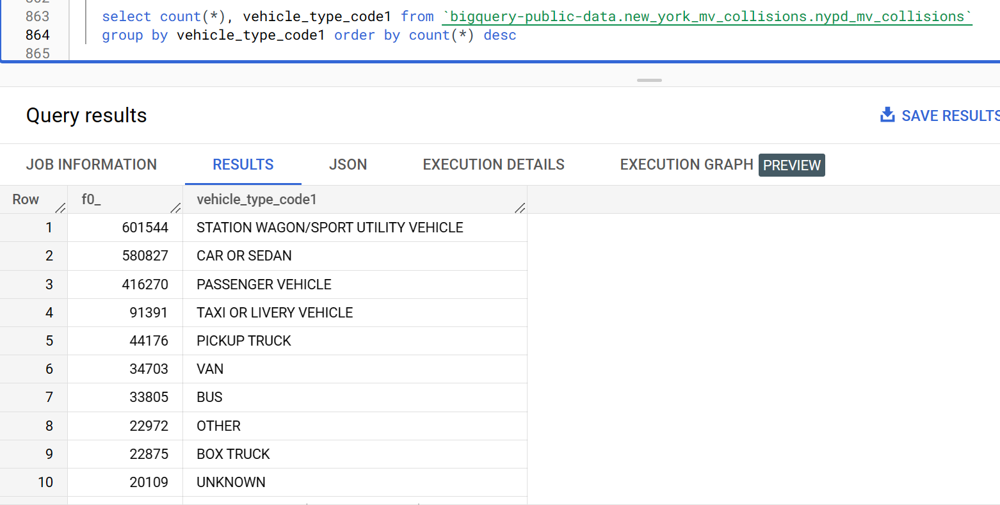

#### **Determine the number of vehicles involved from vehicle type codes**


The main use of vehicle type codes data will be as a **guide for
the number of vehicles involved as an indicator of severity** and for later analysis. We introduced a new field for the total number of vehicles for each collision and integrated the logic to count the number of vehicles into the initial data extraction.


In [ ]:
# Alternative - this step was integrated into the data generation step
[...]
 -- Count the num vehicles involved as vehicle type code and vehicle contributing factors don't correlate well
      (CASE WHEN vehicle_type_code1 IS NOT NULL THEN 1 ELSE 0 END +
       CASE WHEN vehicle_type_code2 IS NOT NULL THEN 1 ELSE 0 END +
       CASE WHEN vehicle_type_code_3 IS NOT NULL THEN 1 ELSE 0 END +
       CASE WHEN vehicle_type_code_4 IS NOT NULL THEN 1 ELSE 0 END +
       CASE WHEN vehicle_type_code_5 IS NOT NULL THEN 1 ELSE 0 END) as num_vehicles_involved
FROM `bigquery-public-data.new_york_mv_collisions.nypd_mv_collisions`
Where EXTRACT(YEAR FROM timestamp) < 2023

# Previous alternative - Add column as num vehicles involved
alter table `uhiproject-363220.Assignment1DS.nypd_mv_collisions`
add column num_vehicles_involved INT64;

# Previous alternative - update the new field for total of vehicles involved based on the vehicle type codes
UPDATE `uhiproject-363220.Assignment1DS.nypd_mv_collisions`
SET num_vehicles_involved =
    CASE WHEN vehicle_type_code1 IS NOT NULL THEN 1 ELSE 0 END +
    CASE WHEN vehicle_type_code2 IS NOT NULL THEN 1 ELSE 0 END +
    CASE WHEN vehicle_type_code_3 IS NOT NULL THEN 1 ELSE 0 END +
    CASE WHEN vehicle_type_code_4 IS NOT NULL THEN 1 ELSE 0 END +
    CASE WHEN vehicle_type_code_5 IS NOT NULL THEN 1 ELSE 0 END
where unique_key is not null ## Token where clause

### **Geographical or location based features**

#### **Invalid latitude and longitude values**

Invalid longitude values were identified. Both the minimum value for latitude (0.0) and maximum value for longitude (0.0) are invalid. The minimum longitude of -201.35 is also invalid.

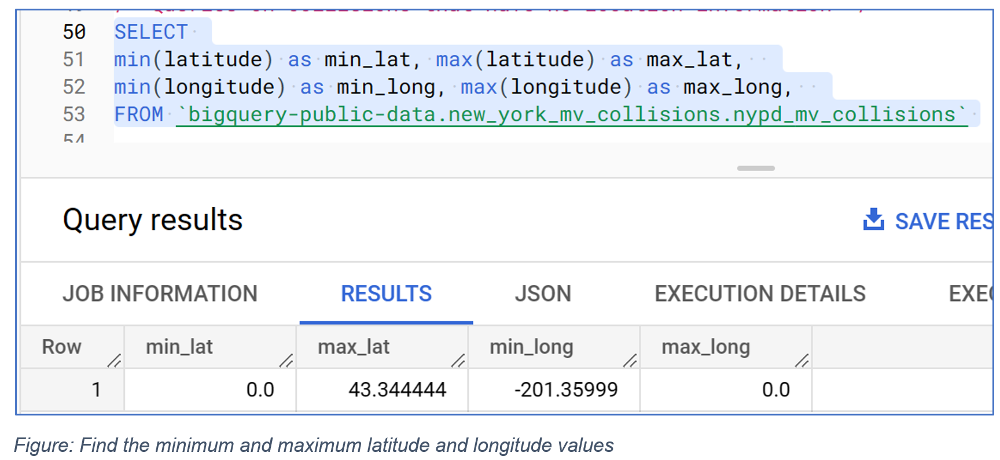

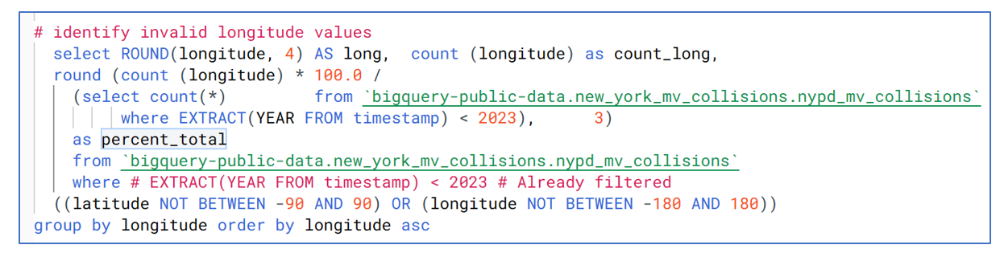

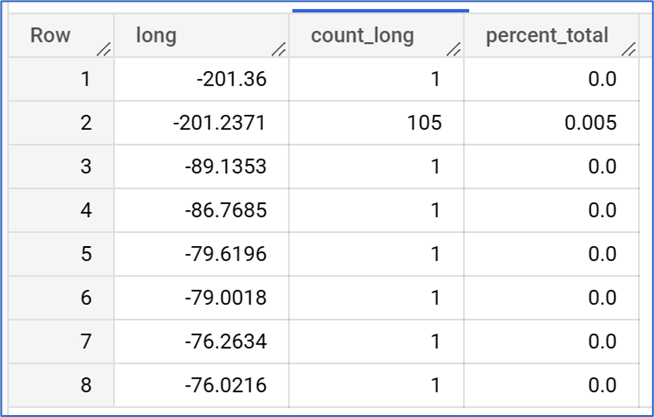

### **Transform or update latitude, longitude and location to null where both are 0.0**

##### **Check step – check extent of latitude and longitude = 0.0 anomaly**

Assessing the extent of the 0.0 latitude anomaly, showed that 4017 (2%) rows are affected. A data cleaning step was identified to set latitude, longitude and location to null where latitude and longitude are 0.0 (.2% or 4016) rows affected.
Later, this step was integrated into the query to extract the data.

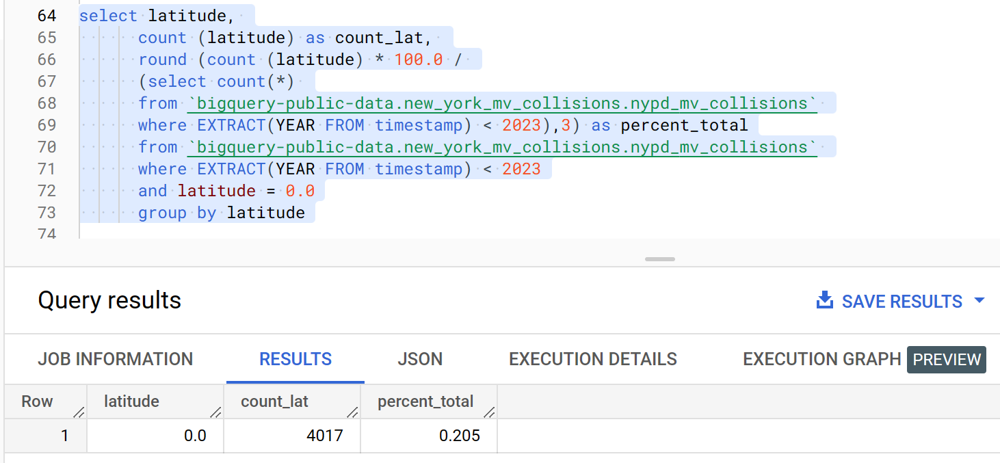

In [ ]:
# Alternative used - integrate update into the data extraction step
SELECT [...]
 (IF (latitude=0.0, null, latitude)) AS latitude, -- 0.0 is invalid -- affects 4016 records
      (IF (longitude=0.0, null, longitude)) AS longitude, -- 0.0 is invalid -- affects 4016
      (IF (longitude=0.0 and latitude=0.0, null, location)) AS location,
[...]
# Previous alternative - Update latitude and longitude to null where both are 0.0
update `uhiproject-363220.Assignment1DS.nypd_mv_collisions`
      set latitude = null, longitude = null, location = null
      where (latitude = 0.0 and longitude = 0.0)


#### **Viewing the number and percent of null values for geographical or location values**

In [ ]:
# Assess the number and % of null cells for geographical values
SELECT
  COUNT(*) AS total_records,
  ROUND((count(*)-COUNT(borough)) * 100 / sum(count(*)) over(),2) as pcent_null_borough,
  (COUNT(*)-COUNT(borough)) AS num_null_borough,
  round((count(*)-COUNT(latitude)) * 100 / sum(count(*)) over(),2) as pcent_null_lat,
  (COUNT(*)-COUNT(latitude)) AS num_null_lat,
  round((count(*)-COUNT(longitude)) * 100 / sum(count(*)) over(),2) as pcent_null_long,
  (COUNT(*)-COUNT(longitude)) AS num_null_long,
  round((count(*)-COUNT(location)) * 100 / sum(count(*)) over(),2) as pcent_null_location,
  (COUNT(*)-COUNT(location)) AS num_null_location,
  round((count(*)-COUNT(zip_code)) * 100 / sum(count(*)) over(),2) as pcent_null_zip,
  (COUNT(*)-COUNT(zip_code)) AS num_zip_code
FROM  `bigquery-public-data.new_york_mv_collisions.nypd_mv_collisions`
 where EXTRACT(YEAR FROM timestamp) < 2023


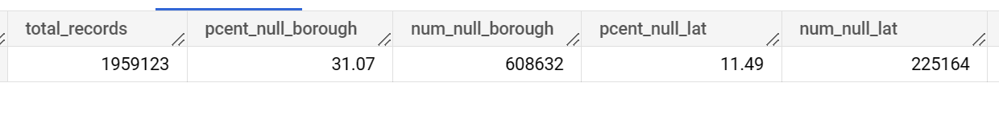

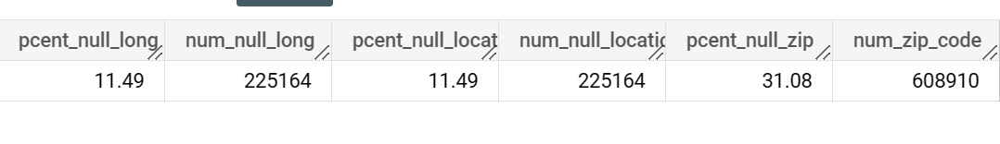

Summary table for missing and invalid values
-	31% of rows have null values for borough
-	31% have null values for zip_code
-	zip_code is never present when borough is null
-	.2% or 4016 rows have an invalid latitude of 0.0.
-	11.5% have null values for latitude, longitude and their derived value location. Location never has a value when latitude and longitude are null.  


#### **Look at the records for the 106 records with the -201.x longitude values**

In [ ]:
# Look at the records for the 106 records with the -201.x longitude valuesselect timestamp, latitude, longitude, on_street_name, cross_street_name, off_Street_name
SELECT timestamp, latitude, longitude, on_street_name, cross_street_name, off_street_name
from `bigquery-public-data.new_york_mv_collisions.nypd_mv_collisions`
where # EXTRACT(YEAR FROM timestamp) < 2023 # alreday filtered
  ((latitude NOT BETWEEN -90 AND 90) OR (longitude NOT BETWEEN -180 AND 180))


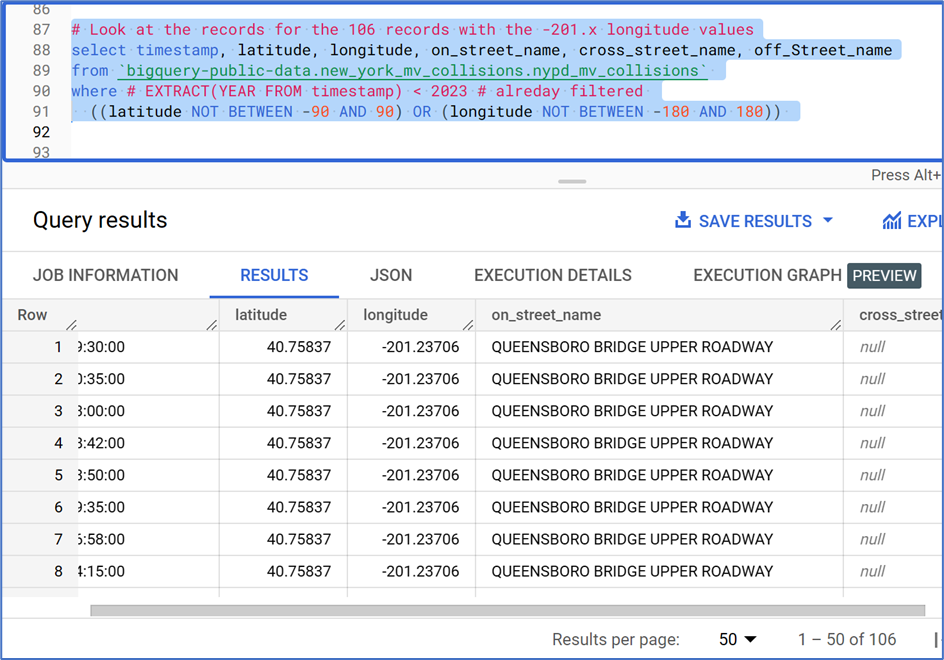

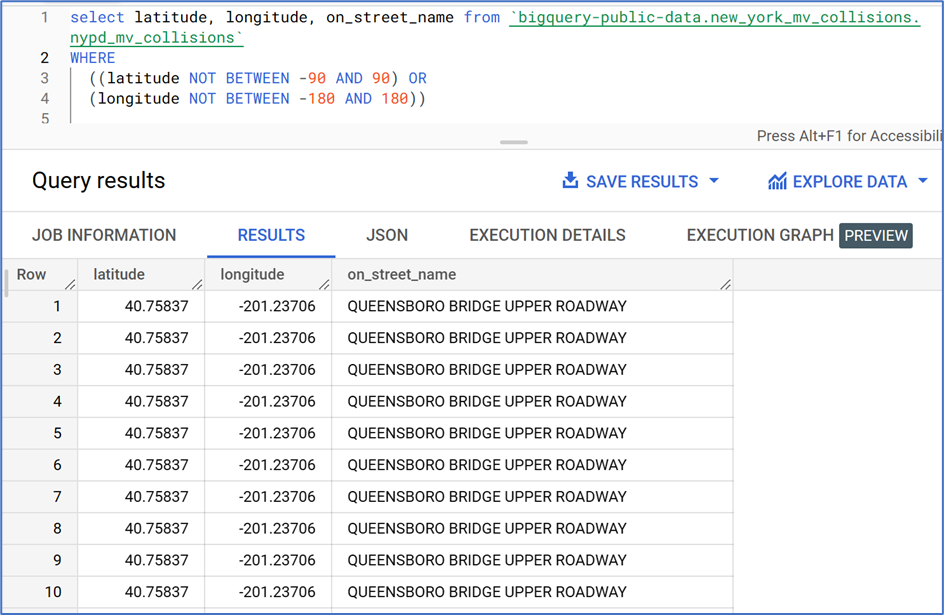

A peculiar set of 106 records emerges that have out of bounds longitude values of -201.35 and similar on_street_name values (“QUEENSBORO BRIDGE UPPER ROADWAY” ). There is again the pattern of a data anomaly replicated to an unusual extent that there must be a reason behind it. All 106 have and a valid latitude for the location specified in on_street_name field.
These can be salvaged by inserting an approximate co-ordinate location as part of data cleaning.  

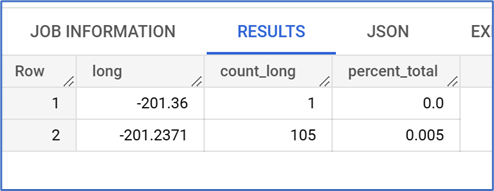

###### **Salvaging the 106 records with -201.x longitude using the 311 dataset**

We can salvage these 106 records by inserting an approximate co-ordinate location.  

###### **Replacement possibilities for incorrect longitudes from the 311 dataset**
The 311 open data dataset has 67 possibilities as an option for approximate replacement latitude.


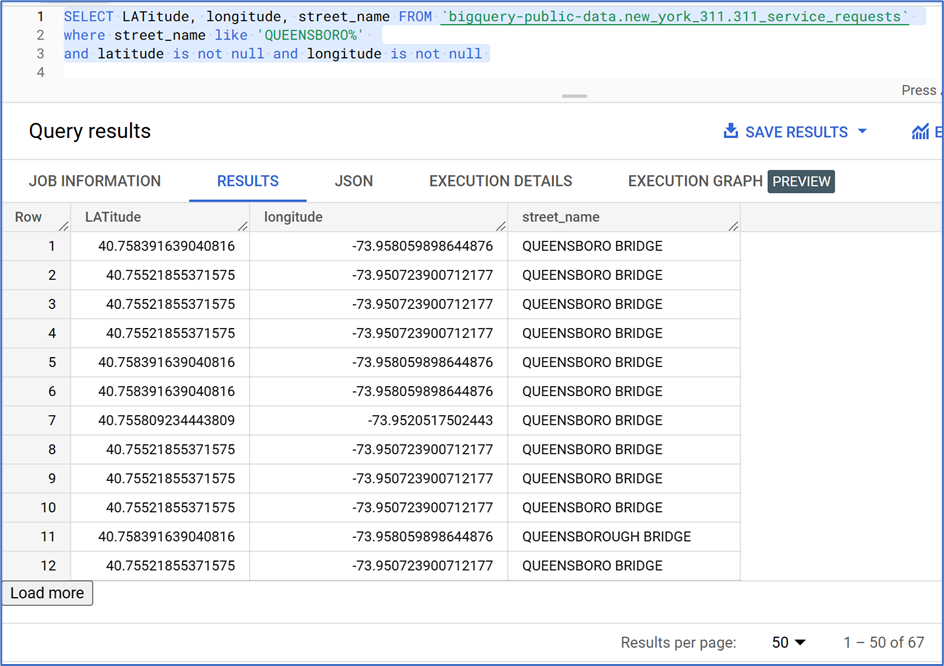

Either of the options below could be used.

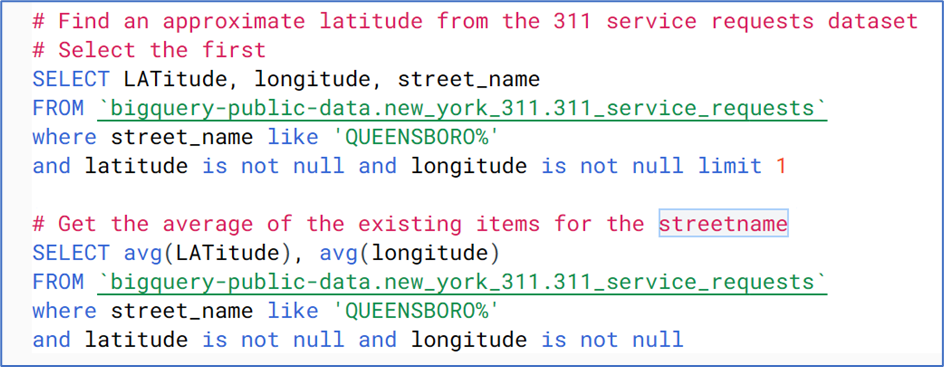

These produced the following coordinates respectively.

The first matching item for the street_name is as follows.  

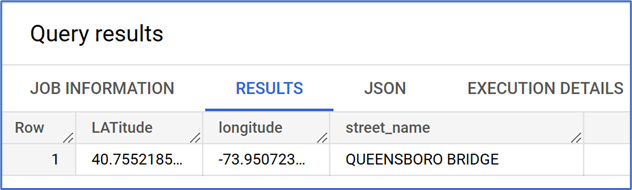

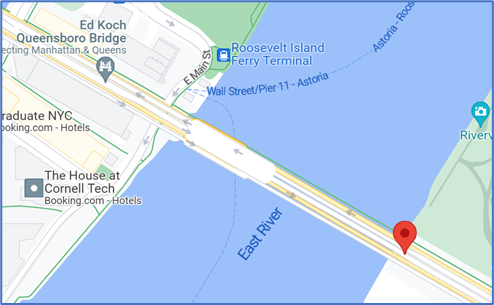

The results based on the average of the existing values.

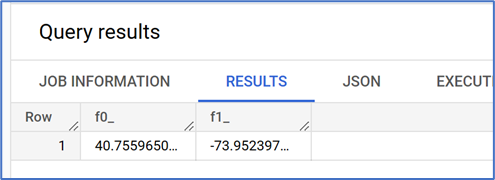

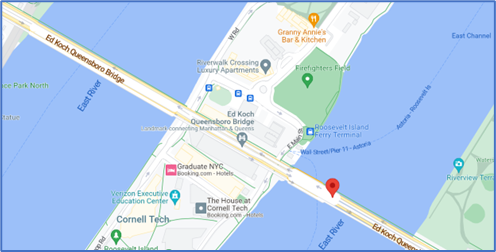

### **QUERY *1* Update the latitude for an out of bounds latitude using the 311 dataset**

In [ ]:
#Update the latitude for an out of bounds latitude using the 311 dataset
update `uhiproject-363220.Assignment1DS.nypd_mv_collisions` set LONGITUDE =
  (SELECT LONGITUDE
  FROM `bigquery-public-data.new_york_311.311_service_requests`
  where street_name like 'QUEENSBORO%'
  and latitude is not null and longitude is not null limit 1)
where (on_street_name like 'QUEENSBORO%' and  longitude NOT BETWEEN -180 AND 180)

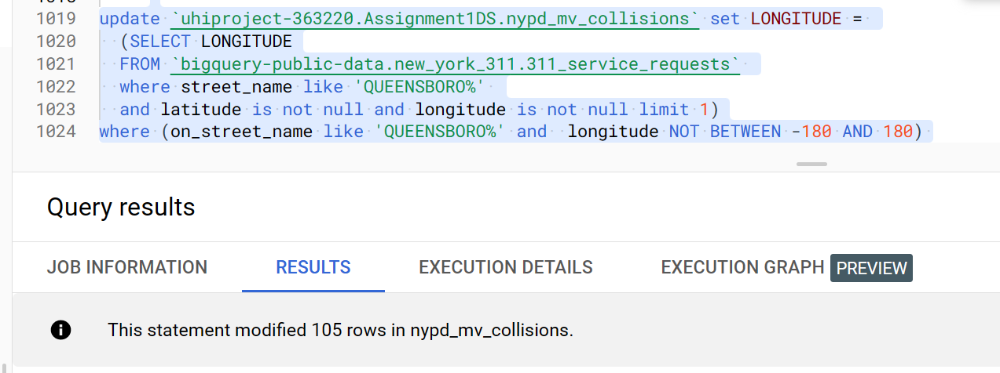

###**Identify records with locations outside of New York City**
I was attempting to finalise a query to identify records having invalid coordinates based on the multipolygons in the Borough boundaries dataset.
The query below is not suitable as all records will be return false for the condition eventually. Ideally, we need the outer polygon around all of the boroughs.


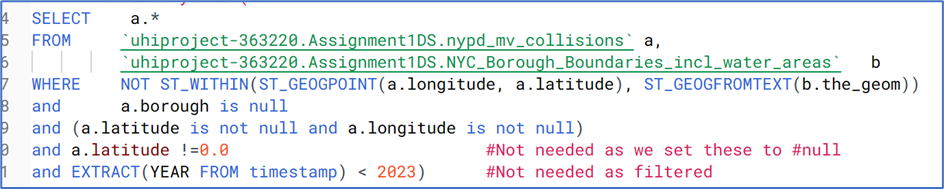

A simple bounding rectangle will be used instead from NYC borough boundaries dataset metadata.

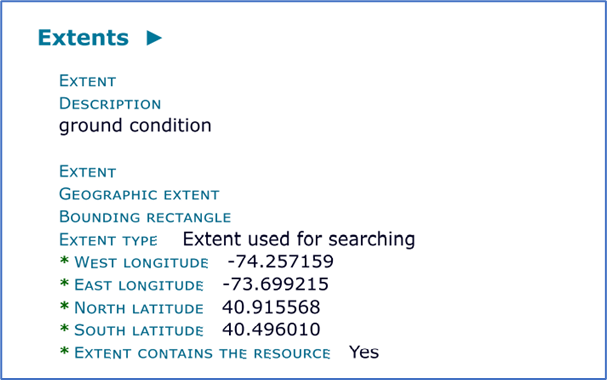

We ran a query to find collisions that had coordinates outside the NYC bounding rectangle

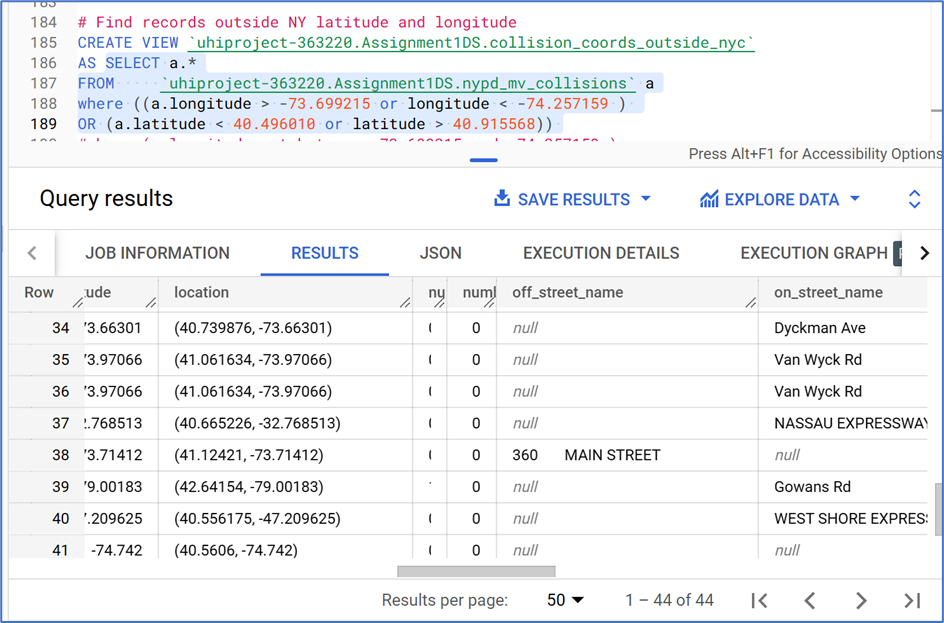

Of the 44 non-NYC co-ordinate collisions are spread over just 13 *on_street_names* with a smaller extent of clustering for *off_street_name*.

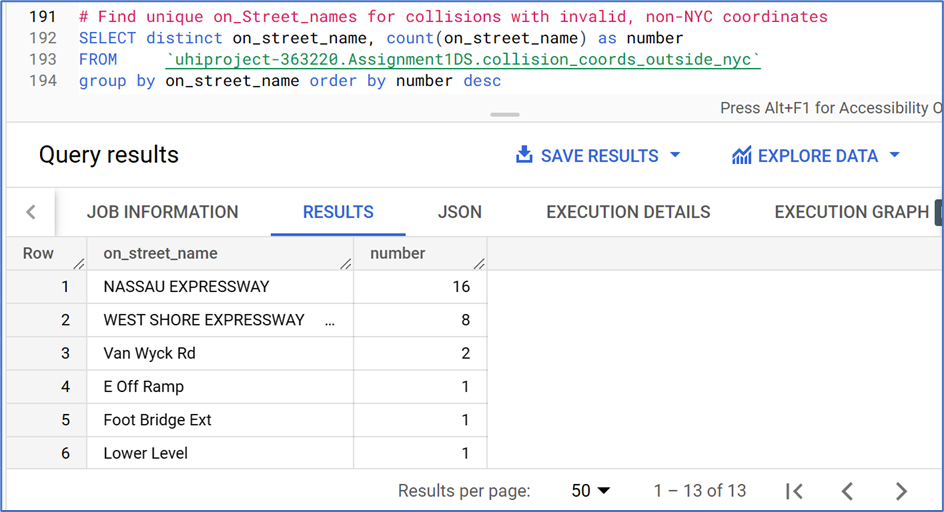

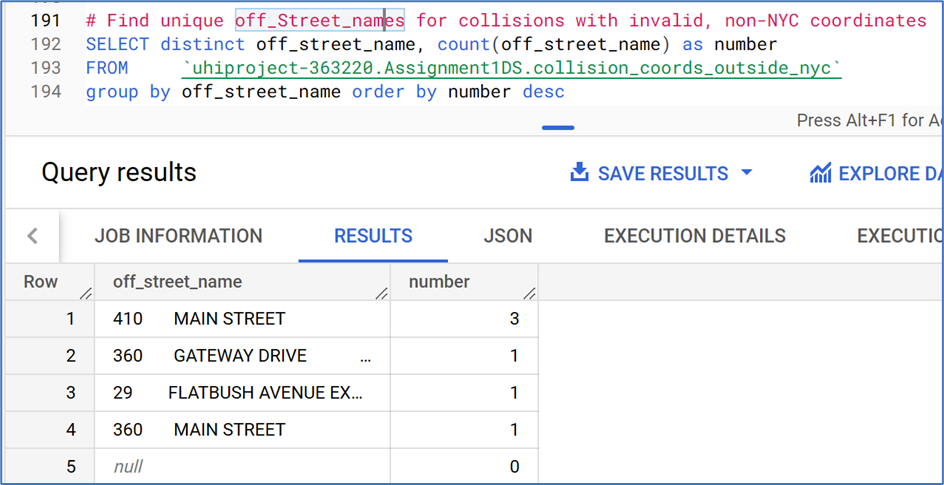

The ***311 dataset*** can be used with a similar query again to fix the 16 instances that share the *`on_street_name`* ‘Nassau Expressway’ and ‘WEST SHORE EXPRESSWAY’.

#### UPDATE 2

In [ ]:
# Use the 311 dataset to fix the 16 instances that share the on_street_name ‘Nassau Expressway’ and 'WEST SHORE EXPRESSWAY’.
update `uhiproject-363220.Assignment1DS.nypd_mv_collisions` a set longitude =
  (SELECT longitude
  FROM `bigquery-public-data.new_york_311.311_service_requests`
  where street_name like 'NASSAU EXPRESSWAY%'
  and latitude is not null and longitude is not null limit 1)
where (on_street_name like 'NASSAU EXPRESSWAY%'
and ((a.longitude > -73.699215 or a.longitude < -74.257159 )
OR (a.latitude < 40.496010 or a.latitude > 40.915568)))

# Use the 311 dataset to fix the 16 instances that share the on_street_name ‘Nassau Expressway’ and 'WEST SHORE EXPRESSWAY’.
update `uhiproject-363220.Assignment1DS.nypd_mv_collisions` a set longitude =
  (SELECT longitude
  FROM `bigquery-public-data.new_york_311.311_service_requests`
  where street_name like 'WEST SHORE EXPRESSWAY%'
  and latitude is not null and longitude is not null limit 1)
where (on_street_name like 'WEST SHORE EXPRESSWAY%'
and ((a.longitude > -73.699215 or a.longitude < -74.257159 )
OR (a.latitude < 40.496010 or a.latitude > 40.915568)))


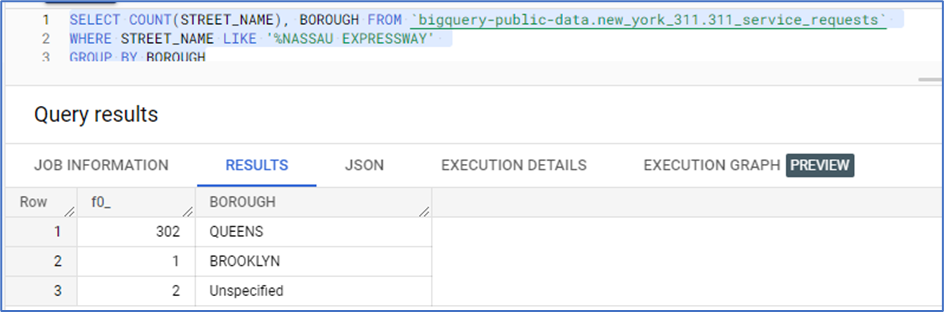

Street names can straddle more than 1 borough. In this case they are mostly Queens (301/302 based on 311 records).

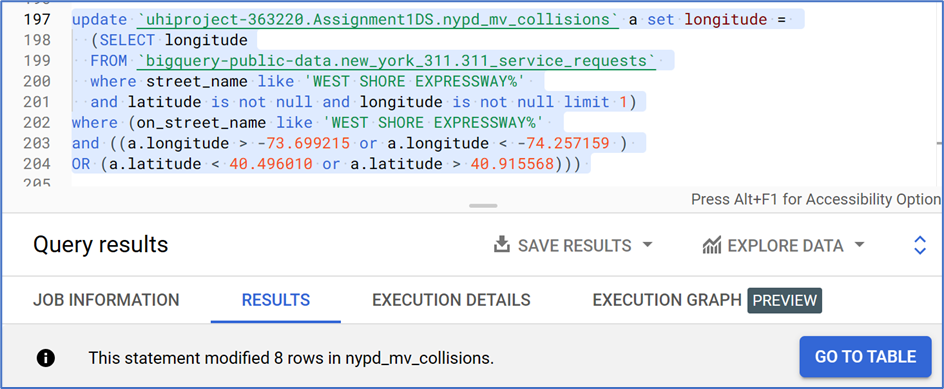

Main Street is not specific enough and has results in all 5 boroughs.

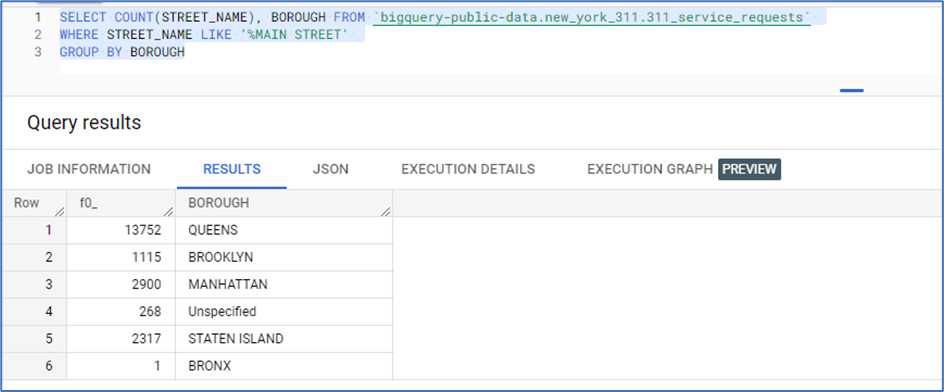

#### UPDATE 4 **Set the remainder inaccurate non-NYC coordinates to null**.
This is because they relate to actual collisions that were in NYC.

In [ ]:
# For the remainder inaccurate non-NYC coordinates, set them to null. This is because they relate to actual collisions that were in NYC.
update `uhiproject-363220.Assignment1DS.nypd_mv_collisions` a
set latitude = null
where
    ((a.longitude > -73.699215 or a.longitude < -74.257159 )
OR  (a.latitude < 40.496010 or a.latitude > 40.915568))


In [ ]:
update `uhiproject-363220.Assignment1DS.nypd_mv_collisions` a
set longitude = null
where
    ((a.longitude > -73.699215 or a.longitude < -74.257159 )
OR  (a.latitude < 40.496010 or a.latitude > 40.915568))


### **Cross-check with the zip code data set**
In the quest to back-fill valid location data, we looked at the potential of zip_codes. There are 233 unique zip codes in the NYC collisions dataset. The option of using the zip codes dataset as a reference to identify invalid zip codes in the collisions set was assessed. Comparing both sets strangely revealed a large number of distinct zip codes in the collisions set that were not in the zip codes set. The supposedly authoritative zip_codes dataset itself was found to be incomplete - a chunk of valid NYC zip codes was missing. The result below shows a gap from (valid) zip_code 11239 to zip code 11351 in the reference set.


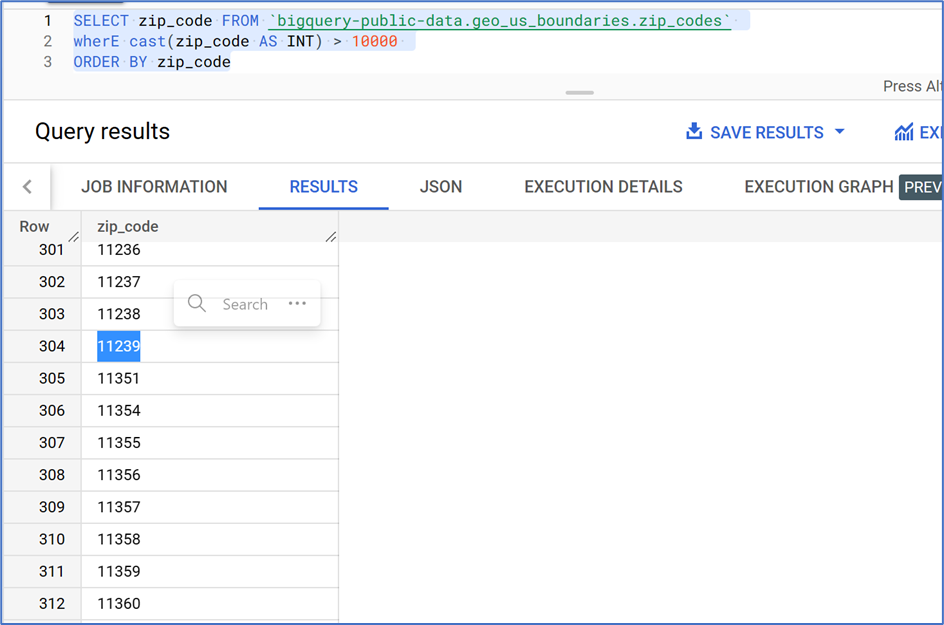

#### Despite the missing data in the zip code dataset, the comparison revealed 388 instances of the invalid code 10000

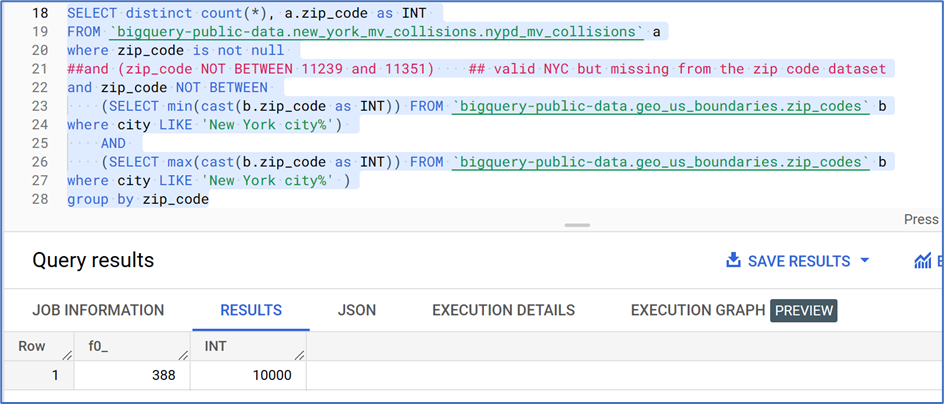

We integrated a step to zip_code instances of '10000' to null into the initial dataset selection/generation query.  

In [ ]:
# Alternative later used - cleansing step was later integrated into initial dataset generation
SELECT
 (IF (zip_code=10000, null, zip_code)) AS zip_code, -- 388 instances - validity based on zip_codes dataset
 []...]

## Initial alternative used - UPdate zip_code to null where it is 10000 (invalid)
update `uhiproject-363220.Assignment1DS.nypd_mv_collisions`
set zip_code = null where zip_code = 10000

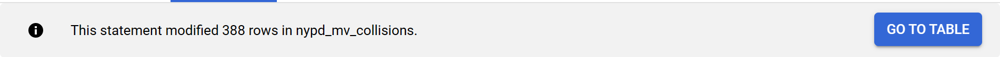

#### **Review of zip code and decision to exclude zip code**
For Zip_code, 31% are null overall. 21% are null when latitude and longitude are not null and when we exclude invalid ‘0.0’ coordinates.   


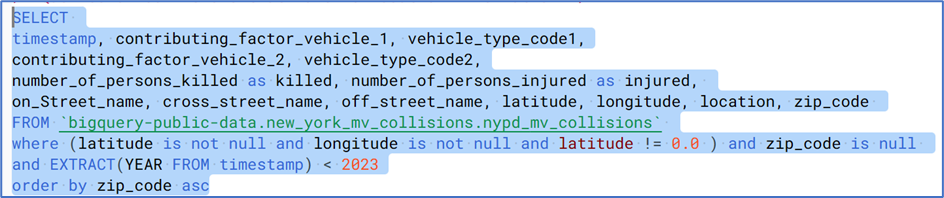

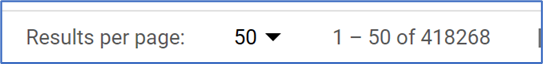

Longitude and latitude are the preferred location identifiers. Zip_code is of interest mainly for its potential to infer approximate missing latitude and longitudes, yet it is not ideal - a lossy transformation. Only 1.97% of records have non-null value for zip_code where latitude and longitude are null or have an invalid ‘0.0’ value. Zip_code isn’t a fallback or good candidate to help to patch up records with missing coordinates. Zip code itself is not a good for geospatial analysis.

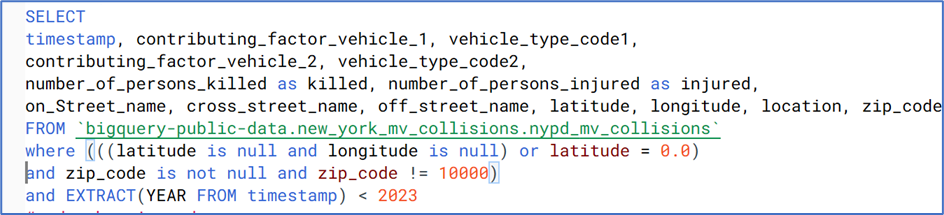

We will exclude the Zip_Code field from the further analysis. It is a similar property to latitude and longitude. As the aim is a linear regression it is better to disregard values that are too alike to avoid skewing the model.

### **Borough**
31% of collision records have null values for ‘borough’. All non-null boroughs have valid borough names.



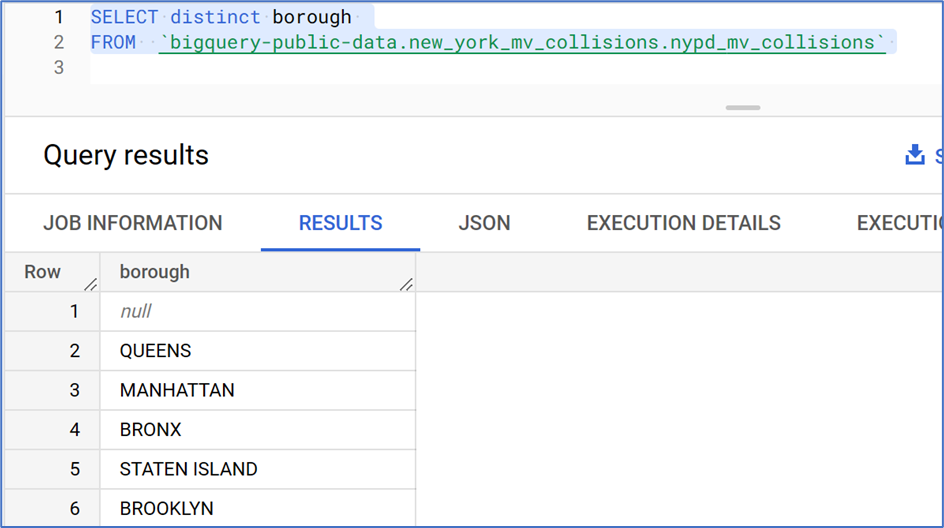

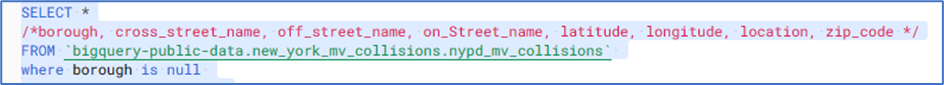

The lack of borough information is significant – both in terms of quantity of missing data and in terms of loss of high-value data for our purposes. We can infer that 29.5% (31-11.5) of records have latitude and longitude data with missing boroughs.  

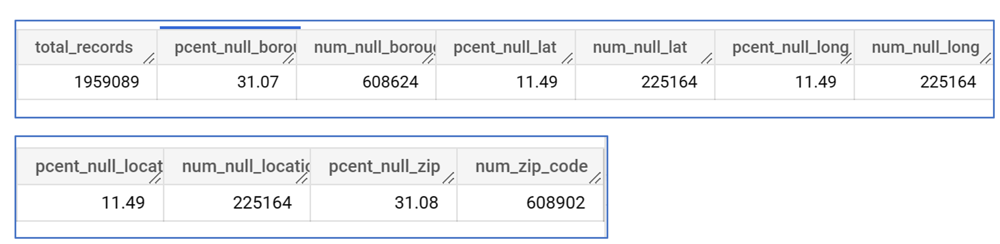

Additionally, 189,633 or 9.62% of rows have null values in ALL of borough, location, latitude, longitude. The result is the same when including zip-code.
In order to discover the location for them we could possibly resort to the values in the various fields for street names which depends in turn on quality in those values. For now, we note this limitation of the data.  


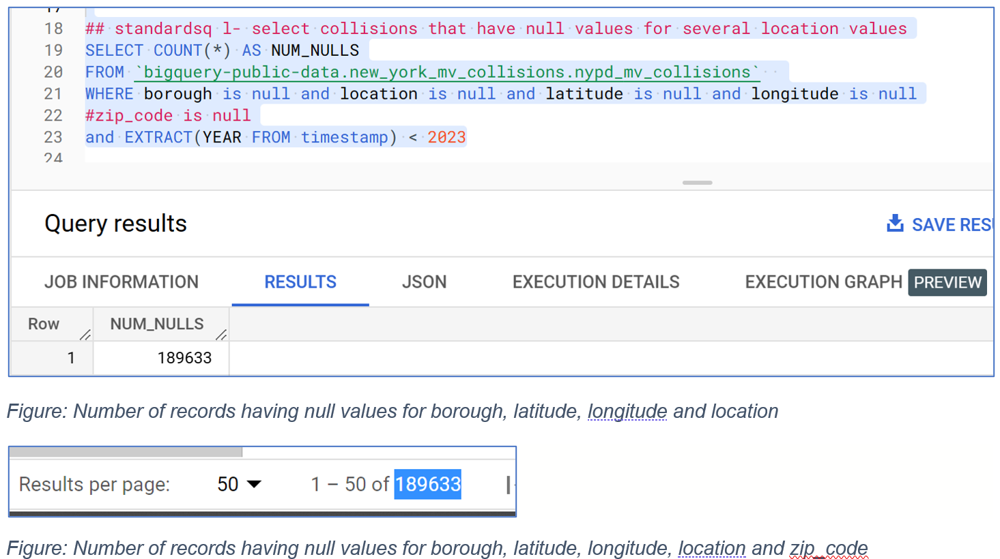

#### **Repace missing boroughs**
##### **Identify where missing boroughs can be replaced / use latitude and longitude to infer the borough**

The [Borough Boundaries NYC Open Data dataset](https://data.cityofnewyork.us/City-Government/Borough-Boundaries/tqmj-j8zm) was imported and queried to identify records where borough values can be substituted.
I found out via the scenic route, that it was important to use the boundaries dataset ***with water areas*** included and that it matched over 7000 more records. The location in the records (40.803947, -73.928) for example are not included within the dataset as shown in the two images below.

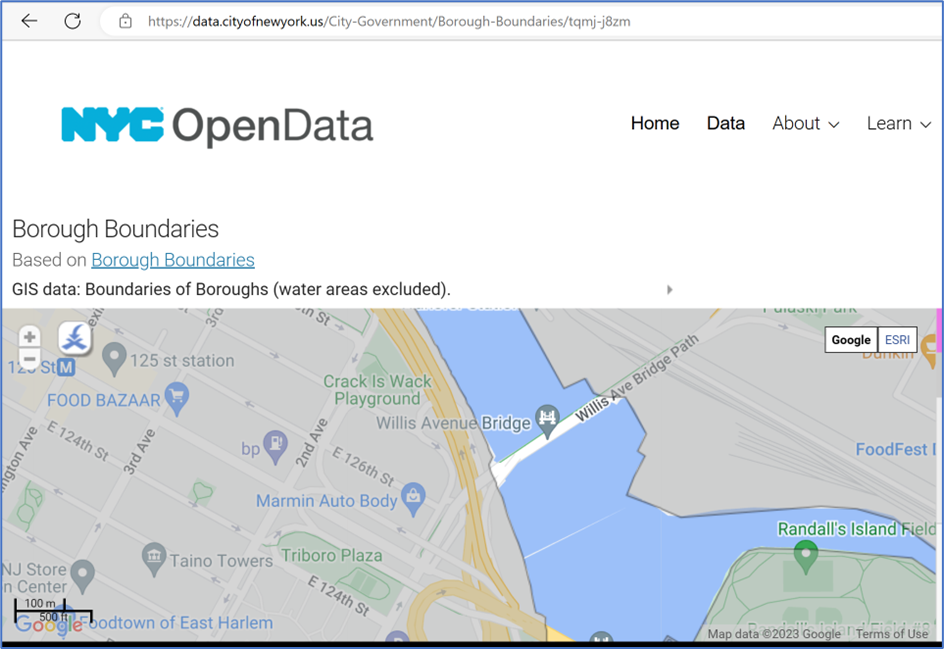

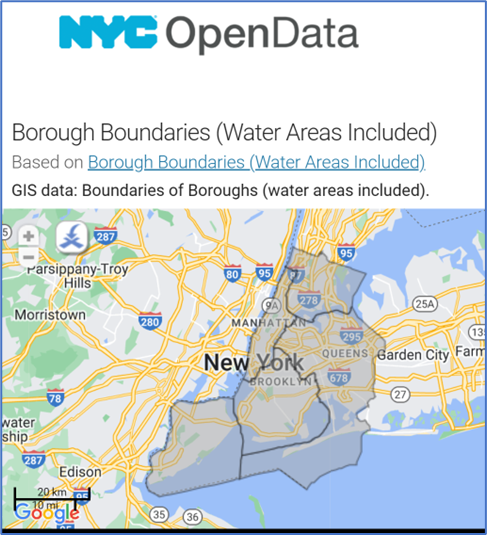

#### **QUERY Create a view of boroughs that can be subsituted from the NYC Borough Boundaries including water areas dataset**


Create a new view that joins the borough name from the **NYC Borough Boundaries** dataset
  (where boroughs are null and  where latitude and longitude are available in the collisions set. )



In [ ]:
## Identify Borough that can be subsituted from the NYC Borough Boundaries including water areas dataset
CREATE VIEW `uhiproject-363220.Assignment1DS.boroughs_to_replace_from_311` as
SELECT    a.unique_key, a.borough, b.BoroName AS borough_to_replace
FROM     `uhiproject-363220.Assignment1DS.nypd_mv_collisions` a,
        `uhiproject-363220.Assignment1DS.NYC_Borough_Boundaries_incl_water_areas`   b
WHERE    ST_WITHIN(ST_GEOGPOINT(a.longitude, a.latitude), ST_GEOGFROMTEXT(b.the_geom))
and      a.borough is null
and (a.latitude is not null and a.longitude is not null)


In [ ]:
## LATEST
## Identify Borough that can be subsituted from the NYC Borough Boundaries including water areas dataset
CREATE TABLE `uhiproject-363220.Assignment1DS.boroughs_to_replace_from_311_by_geo` as
SELECT    a.unique_key, upper(a.borough) as borough, upper(b.BoroName) AS borough_to_replace
FROM     `uhiproject-363220.Assignment1DS.nypd_mv_collisions` a,
        `uhiproject-363220.Assignment1DS.NYC_Borough_Boundaries_incl_water_areas`   b
WHERE    ST_WITHIN(ST_GEOGPOINT(a.longitude, a.latitude), ST_GEOGFROMTEXT(b.the_geom))
and      a.borough is null
and (a.latitude is not null and a.longitude is not null)


There are **417,746** (count view) sights for the purposes of the study. It is possible to aggregate collision data by boroughs. This is quite meaningful and insights could potentially be derived to guide preventative action and resources per borough. Street names can traverse boroughs as some are quite long. Streets are also very granular for an overview.

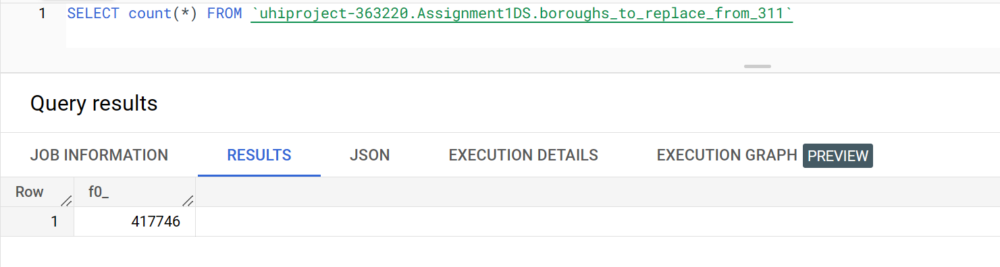

#### use query for this instead remove below later

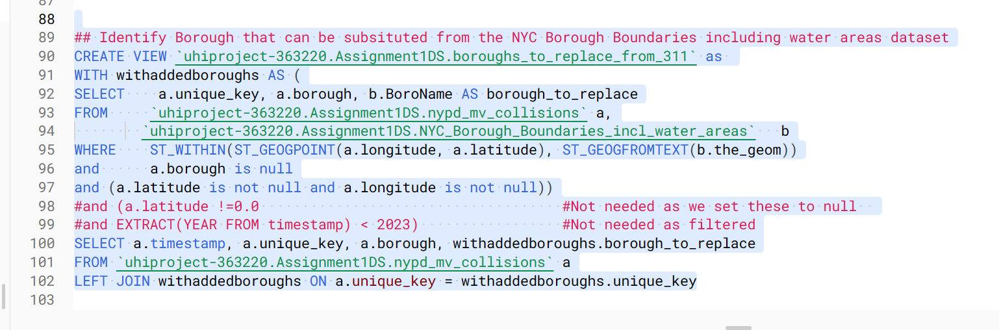

#### **Update null borough using Borough Boundaries NYC Open Data data set**

#### **QUERY 6 Insert the borough values from the Borough boundaries NYC dataset***


In the initial collision data extraction, we added a placeholder field for the borough data from the 311 dataset.

In [ ]:
# Alternative - add a new placeholder field in the step to extract the data
SELECT [...]
      null as borough_from_311, -- placeholder for later update from 311 dataset
[...]
# Previous alternative - Add a new column to hold the value from the borough dataset
ALTER TABLE `uhiproject-363220.Assignment1DS.nyc_mv_collisions_round1`
ADD COLUMN borough_from_borough_ds STRING

#### **Insert the new Boroughs into the placeholder column**

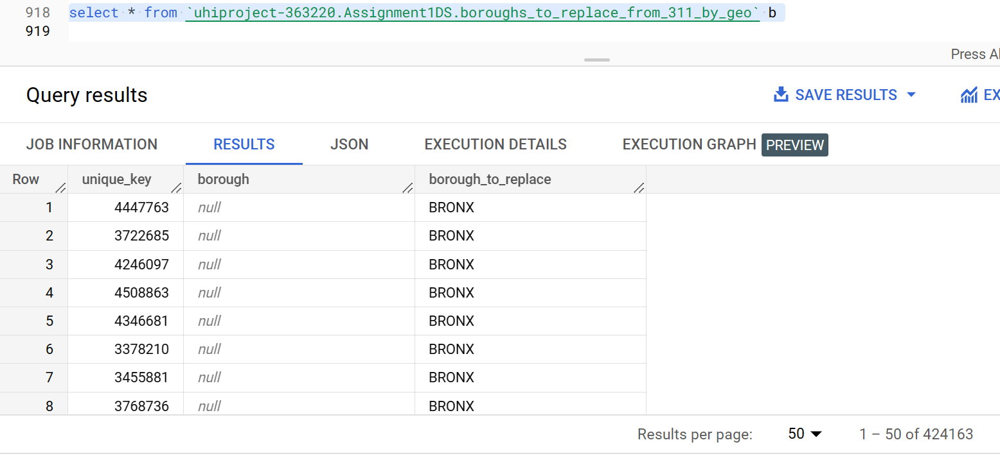

There are over 424K potential boroughs.

In [ ]:
# Insert the borough values from the Borough dataset
UPDATE `uhiproject-363220.Assignment1DS.nypd_mv_collisions` a
SET a.borough = b.borough_to_replace
FROM `uhiproject-363220.Assignment1DS.boroughs_to_replace_from_311_by_geo` b
WHERE a.unique_key = b.unique_key
and a.borough is null

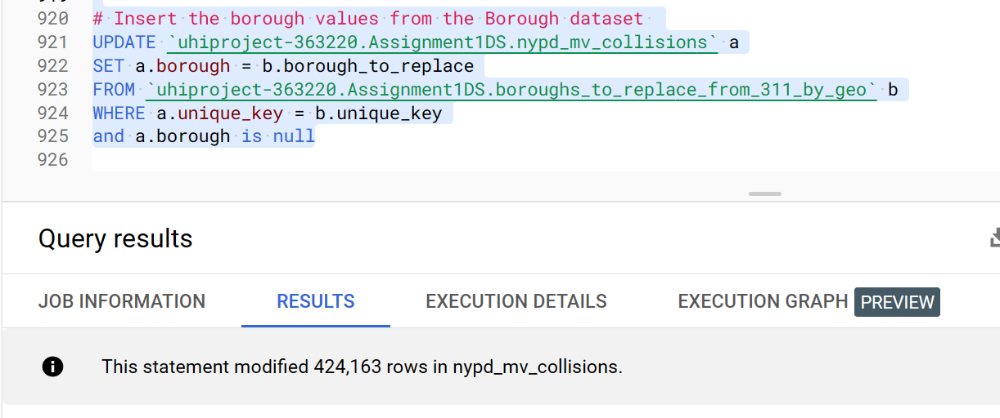

This inserted the brough for 417,746 rows - over 7000 more than when using the water areas excluded dataset.  

In [ ]:
select count(*) from `uhiproject-363220.Assignment1DS.nypd_mv_collisions`
WHERE borough IS NULL

Checking the results, shows that there are still 190886 null records which is more than expected and is due to null latitude and longitude values.


A check was run to view how many are null now that do not have null latitude and longitude

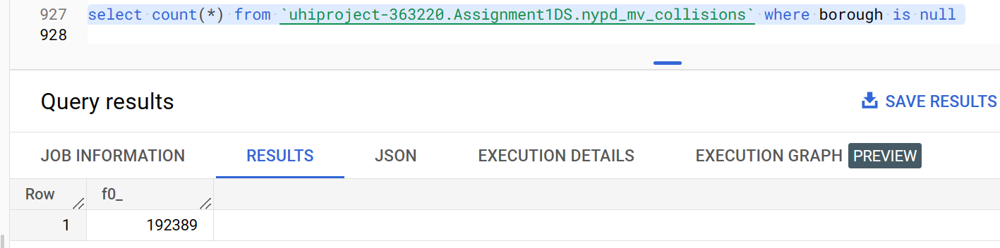

#### **Review remaining null boroughs now that do not have null latitude and longitude**

In [ ]:
# i check how many are null now that do not have null latitude and longitude
SELECT *
FROM `uhiproject-363220.Assignment1DS.nypd_mv_collisions`
   where borough is null
   and (latitude is not null and longitude is not null)


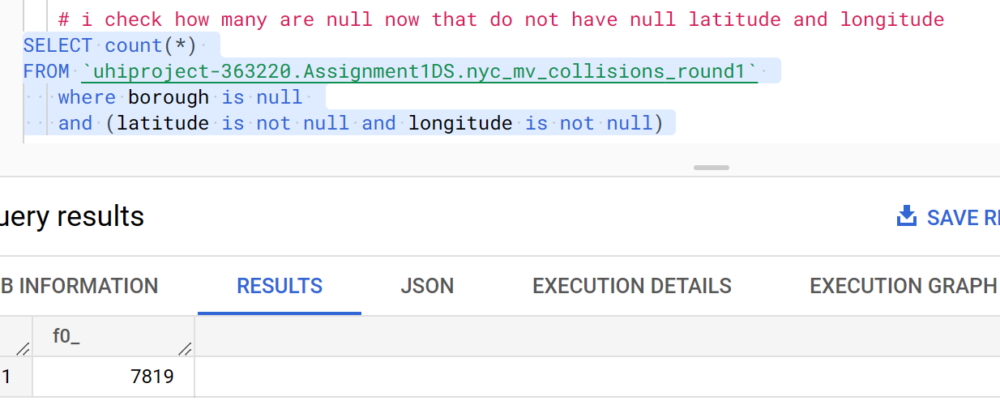

In the latest iteration, this result was quite low as follows.

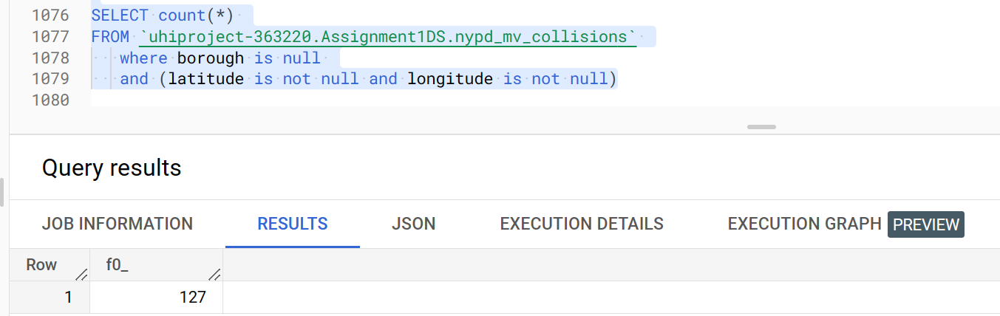

#### **Replace Boroughs from 311 dataset using street_name**
**off_street_name** or **on_street_name** alone is not a reliable indicator of the borough. The example below shows 3 boroughs that have street name ‘East 14 Street’ in the 311 service requests dataset.

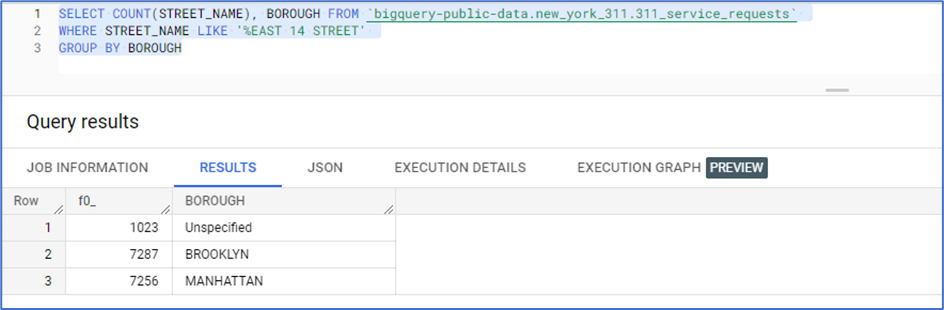

#### **Join null boroughs with matching boroughs from 311 dataset based on street names and cross streets**

We can update null Boroughs where the on street and cross street names match one or more records in the 311 dataset. By comparing the **on_street_name** and **cross street** references to those in the 311 dataset, the boroughs can be updated reliably for almost 10000 records.  



#### **Sanitize street names using regular expressions fields for better matching with 311 set**
There are variants for street names e.g. AVENUE, Ave, STREET. Sanitizing queries were run on the 3 fields with street names; **on_street_name**, **off_street_name** and **cross_street_name** to improve the chances of matching them with combinations from the 311 dataset.



In [ ]:
# examples for off_Street_names using regular expressions
#1 1ST, 2ND, 3RD STREET ETC, ...10TH -> 1, 2, 3, 10
UPDATE `uhiproject-363220.Assignment1DS.nypd_mv_collisions`
SET off_street_name = REGEXP_REPLACE(off_street_name, "(TH|ND|RD)", "")
WHERE
#REGEXP_CONTAINS(off_street_name, "^([0-9]|[0-9][0-9]|[0-9][0-9][0-9])(TH|ND|RD) (AVE|AVENUE|STREET|ST|ST.|DR.|RD)") OR
REGEXP_CONTAINS(off_street_name, "([0-9]|[0-9][0-9]|[0-9][0-9][0-9])(TH|ND|RD) (AVE|AVENUE|STREET|ST|ST.|DR.|RD)")

# 2 Avenue
UPDATE `uhiproject-363220.Assignment1DS.nypd_mv_collisions`
SET off_street_name = REGEXP_REPLACE(off_street_name, " (AV|AV.|AVE|AVE.) ", " AVENUE ")
WHERE REGEXP_CONTAINS(off_street_name, " (AV.|AVE|AVE.|AV) ") or ends_with(off_street_name, 'AVE')

# 2 Avenue
UPDATE `uhiproject-363220.Assignment1DS.nypd_mv_collisions`
SET off_street_name = REGEXP_REPLACE(off_street_name, " (AV|AV.|AVE|AVE.)", " AVENUE")
WHERE REGEXP_CONTAINS(off_street_name, " (AV.|AVE|AVE.|AV)") AND
 (ends_with(off_street_name, 'AV') OR ends_with(off_street_name, 'AV.') OR ends_with(off_street_name, 'AVE'))

# 3. Street)
UPDATE `uhiproject-363220.Assignment1DS.nypd_mv_collisions`
SET off_street_name = REGEXP_REPLACE(off_street_name, " (ST|ST.) ", " STREET ")
WHERE REGEXP_CONTAINS(off_street_name, " (ST.|ST) ")

# 2 Avenue
UPDATE `uhiproject-363220.Assignment1DS.nypd_mv_collisions`
SET off_street_name = REGEXP_REPLACE(off_street_name, " (ST|ST.)", " STREET")
WHERE REGEXP_CONTAINS(off_street_name, " (ST.|ST)") AND
 (ends_with(off_street_name, 'ST') OR ends_with(off_street_name, 'ST'))

# 4. Dr/DR -> Drive
UPDATE `uhiproject-363220.Assignment1DS.nypd_mv_collisions`
SET off_street_name = REGEXP_REPLACE(off_street_name, " (DR|DR.) ", " DRIVE ")
WHERE REGEXP_CONTAINS(off_street_name, " (DR.|DR) ")

# 5. RD./RD -> ROAD
UPDATE `uhiproject-363220.Assignment1DS.nypd_mv_collisions`
SET off_street_name = REGEXP_REPLACE(off_street_name, " (RD.|RD) ", " ROAD ")
WHERE REGEXP_CONTAINS(off_street_name, "(RD|RD.) ") OR  ENDS_WITH(off_street_name,' RD')

#6 Boulevard
UPDATE `uhiproject-363220.Assignment1DS.nypd_mv_collisions`
SET off_street_name = REGEXP_REPLACE(off_street_name, "(BLVD|BLV)", "BOULEVARD")
WHERE REGEXP_CONTAINS(off_street_name, "(BLVD|BLV)")

SELECT off_street_name,  REGEXP_REPLACE(off_street_name, "(BLVD|BLV)", "BOULEVARD")
FROM  `uhiproject-363220.Assignment1DS.nypd_mv_collisions`
WHERE REGEXP_CONTAINS(off_street_name, "(BLVD|BLV)")

#7. Street
UPDATE `uhiproject-363220.Assignment1DS.nypd_mv_collisions`
SET off_street_name = REGEXP_REPLACE(off_street_name, " (ST|ST.) ", " STREET ")
WHERE REGEXP_CONTAINS(off_street_name, " (ST|ST.) ") OR ENDS_WITH(off_street_name,' ST')

#7. Street
UPDATE `uhiproject-363220.Assignment1DS.nypd_mv_collisions`
SET off_street_name = REGEXP_REPLACE(off_street_name, " ST", " STREET ")
WHERE ENDS_WITH(off_street_name,' ST')

#8. Expressway
UPDATE `uhiproject-363220.Assignment1DS.nypd_mv_collisions`
SET off_street_name = REGEXP_REPLACE(off_street_name, "(EXPY|EXPWY)", "EXPRESSWAY")
WHERE REGEXP_CONTAINS(off_street_name, "(EXPY|EXPWY)")

UPDATE `uhiproject-363220.Assignment1DS.nypd_mv_collisions`
SET off_street_name = REGEXP_REPLACE(off_street_name, "PKWY", "PARKWAY")
WHERE REGEXP_CONTAINS(off_street_name, "PKWY")

# 8. Condense spaces
UPDATE `uhiproject-363220.Assignment1DS.nypd_mv_collisions`
SET off_street_name = replace(replace(replace(off_street_name,' ','<>'),'><',''),'<>',' ')
WHERE REGEXP_CONTAINS(off_street_name, "( |,  |,   ) ")

#### **Create a view to combine boroughs from the 311 dataset with the same combinations of street names and cross street names**
We found the distinct combinations of street and cross street records with boroughs from 311 dataset.


In [ ]:
 # Create a table to combine boroughs from the 311 dataset with the same combinations of street names and cross street names
 # Distinct combinations of street and cross street records with boroughs from 311 dataset
 create table `uhiproject-363220.Assignment1DS.boroughs_matched_from311_streetcrossstreetcombos` AS
 WITH streetscrossstreetcombos AS (
    SELECT upper(b.street_name) as street_name, upper(b.cross_street_1) as cross_street_1, upper(b.borough) as borough, #b.unique_key
      FROM `bigquery-public-data.new_york_311.311_service_requests` b
      where (b.street_name is not null and b.borough not like '%Unspecified')
      and b.street_name != b.cross_street_1
      GROUP BY b.street_name, b.cross_street_1, b.borough #, unique_key
    )
    # Join the borough from 311 dataset with the street and cross street combination
    SELECT streetscrossstreetcombos.borough as borough311, a.borough, a.unique_key,
    streetscrossstreetcombos.street_name as street_name311, a.on_street_name,
    a.cross_street_name, streetscrossstreetcombos.cross_street_1 as cross_street311 #c.borough, c.longitude, c.latitude
    FROM `uhiproject-363220.Assignment1DS.nypd_mv_collisions` a
    inner JOIN streetscrossstreetcombos ON
    (a.on_street_name = streetscrossstreetcombos.street_name and a.cross_street_name = streetscrossstreetcombos.cross_street_1) and a.borough is null

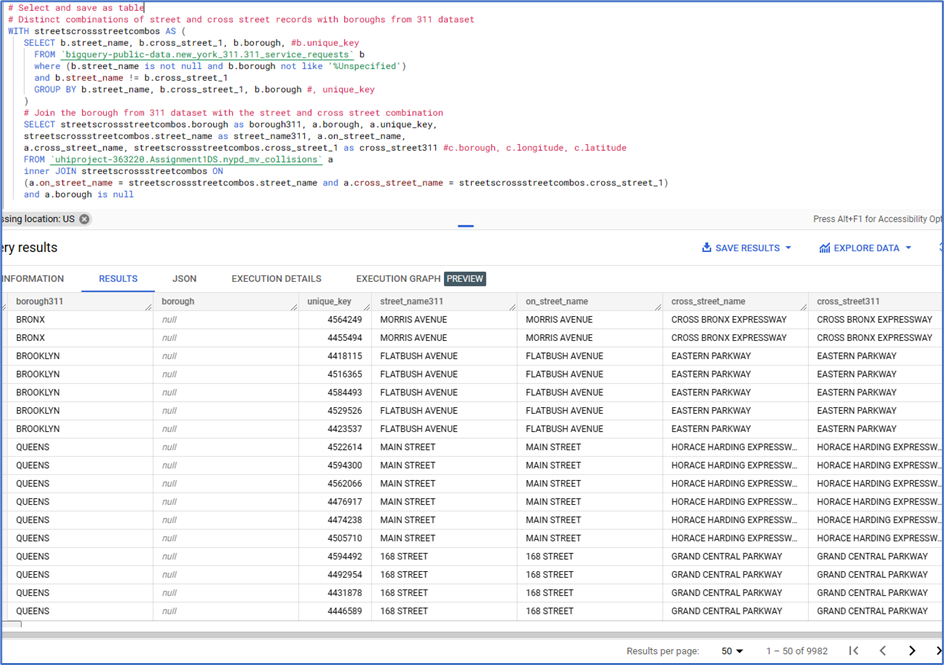

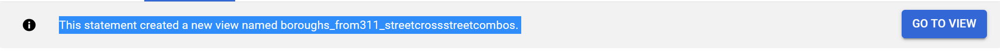

SELECT * FROM `uhiproject-363220.Assignment1DS.boroughs_matched_from311_streetcrossstreetcombos`

The results were saved as a table. There are 84K results.

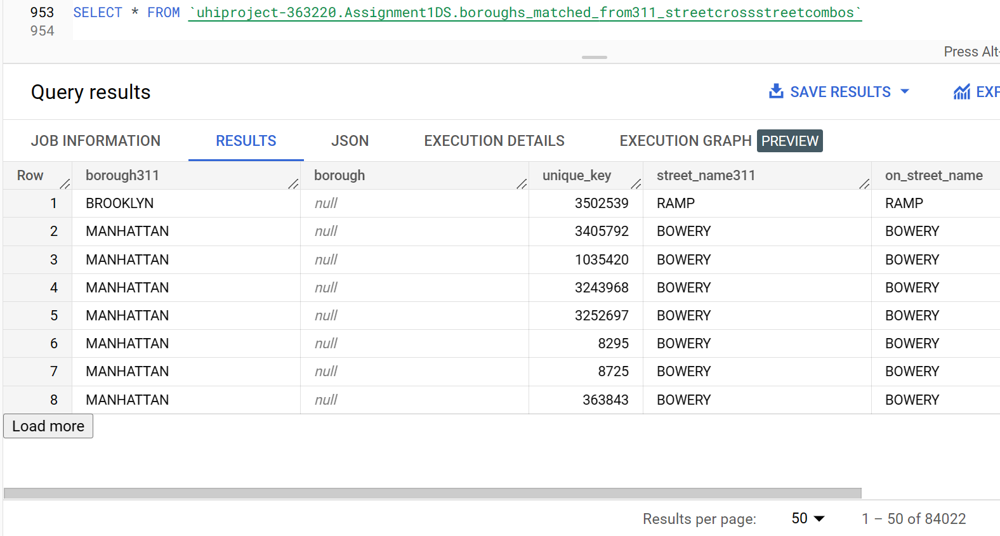

However this produced some where the Boroughs still differ for the same street / cross street combination. 310 records so this will affect 105 records (half). ?????????????????

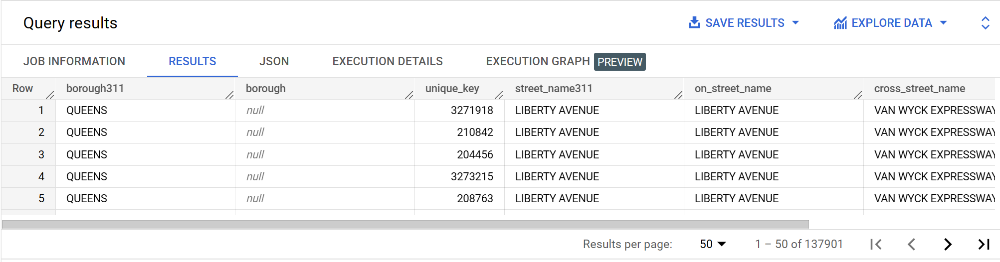

In [ ]:
#In the street / cross street / borough unique combos, find out how many street names / cross street combos have conflicting boroughs
select a.unique_key, a.borough311, a.street_name311, a.cross_street311 from
uhiproject-363220.Assignment1DS.boroughs_from311_streetcrossstreetcombos a,
uhiproject-363220.Assignment1DS.boroughs_from311_streetcrossstreetcombos b
where a.unique_key = b.unique_key
and a.borough311 != b.borough311
order by unique_key, a.street_name311, a.cross_street311


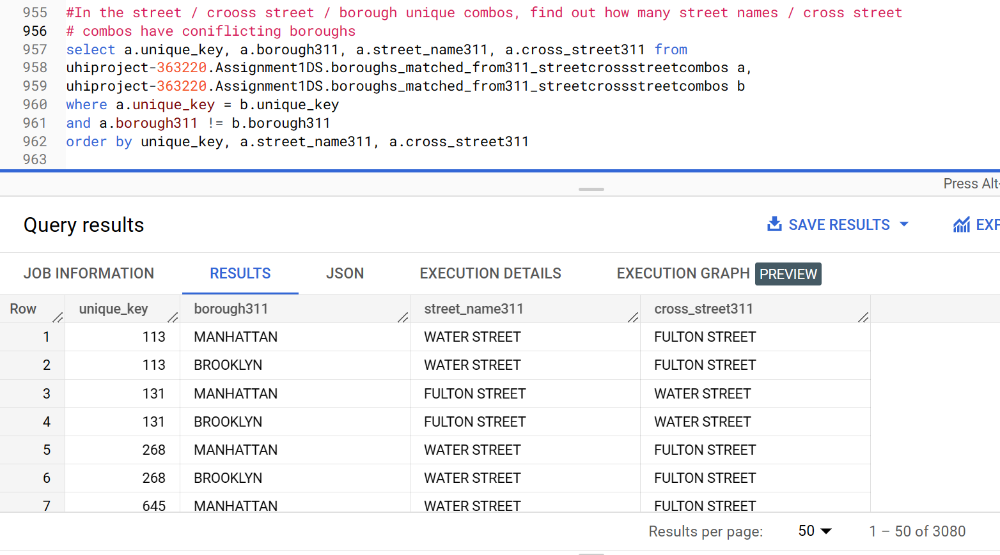

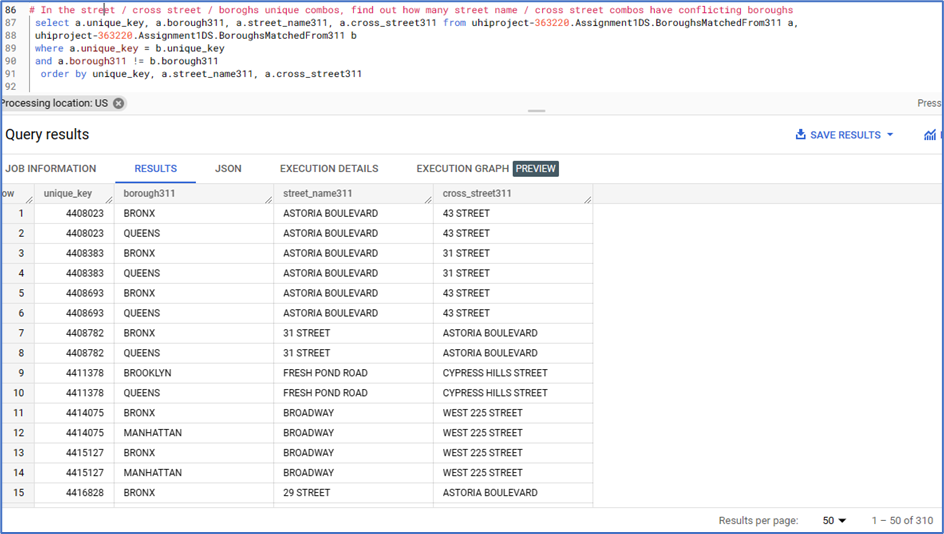

The two here for one borough versus 713 for another.
So we need to eliminate these.


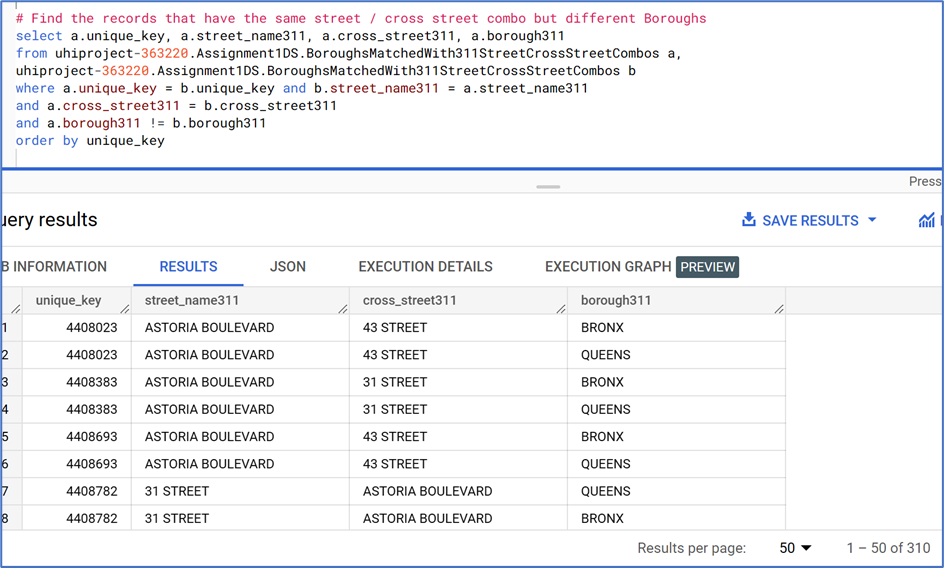

In [ ]:
# Delete the records that have the same street / cross street combo but different Boroughs
Delete from uhiproject-363220.Assignment1DS.boroughs_matched_from311_streetcrossstreetcombos
where unique_key in (select a.unique_key
from uhiproject-363220.Assignment1DS.boroughs_matched_from311_streetcrossstreetcombos a,
uhiproject-363220.Assignment1DS.boroughs_matched_from311_streetcrossstreetcombos b
where a.unique_key = b.unique_key and b.street_name311 = a.street_name311
and a.cross_street311 = b.cross_street311
and a.borough311 != b.borough311
)
## Deleted 3110 rows


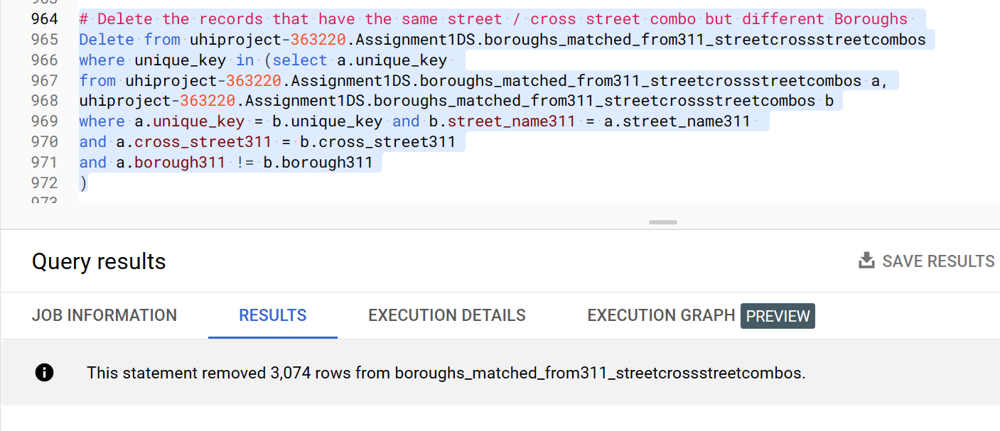

#### **Delete the records that have the same street / cross street combo but different Boroughs from the table of matched boroughs**

#### **Update the Boroughs in the collisions dataset with the remaining records**

In [ ]:
# Delete the records that have the same street / cross street combo but different Boroughs
#Delete from uhiproject-363220.Assignment1DS.Boroughs_matched_from311_bystreet_cross_street_combos
#where unique_key in (select a.unique_key
#from uhiproject-363220.Assignment1DS.Boroughs_matched_from311_bystreet_cross_street_combos a,
#uhiproject-363220.Assignment1DS.Boroughs_matched_from311_bystreet_cross_street_combos b
#where a.unique_key = b.unique_key and b.street_name311 = a.street_name311
#and a.cross_street311 = b.cross_street311
#and a.borough311 != b.borough311
#)

We deleted the records that had the same street / cross street combo but different Boroughs from the table of matched boroughs based on on street/cross street combinations.  


#### **QUERY** Merge

In [ ]:
# Merge the Boroughs from the 311 Dataset into the collisions set (from the matched street/cross street set)
update `uhiproject-363220.Assignment1DS.nypd_mv_collisions` a
set a.borough = b.borough311
from
  `uhiproject-363220.Assignment1DS.boroughs_matched_from311_streetcrossstreetcombos` b
  where a.unique_key = b.unique_key and a.borough is null

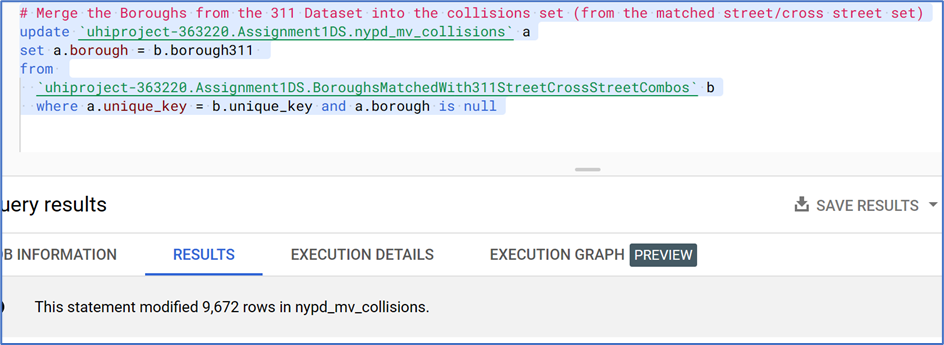

This updated 80,577 previously null borough records. In a previous iteration before sanitising the street names it was much less at 9672 (above).

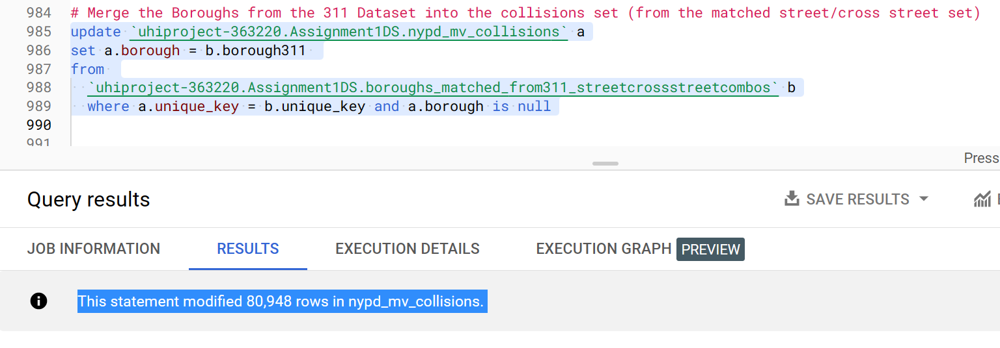

cehck screen below and above - dups different results

In [ ]:
select * from `uhiproject-363220.Assignment1DS.nypd_mv_collisions` a limit 1000

In [ ]:
  select count(*) from `uhiproject-363220.Assignment1DS.nypd_mv_collisions` where borough is null


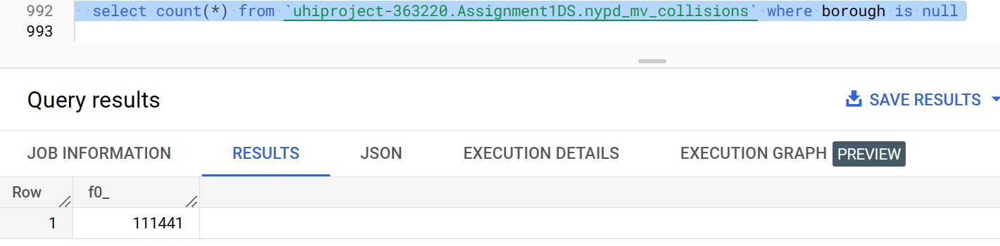

In [ ]:
 # Of 715 with the street combo 2 are in Bronx - outliers => delete
  SELECT COUNT(*)      FROM `bigquery-public-data.new_york_311.311_service_requests`
      WHERE street_name like '31 STREET' AND cross_street_1 like 'ASTORIA BOULEVARD' ANd borough like 'BRONX'
      UNION all
  SELECT COUNT(*)      FROM `bigquery-public-data.new_york_311.311_service_requests`
      WHERE street_name like '31 STREET' AND cross_street_1 like 'ASTORIA BOULEVARD' ANd borough like 'QUEENS'


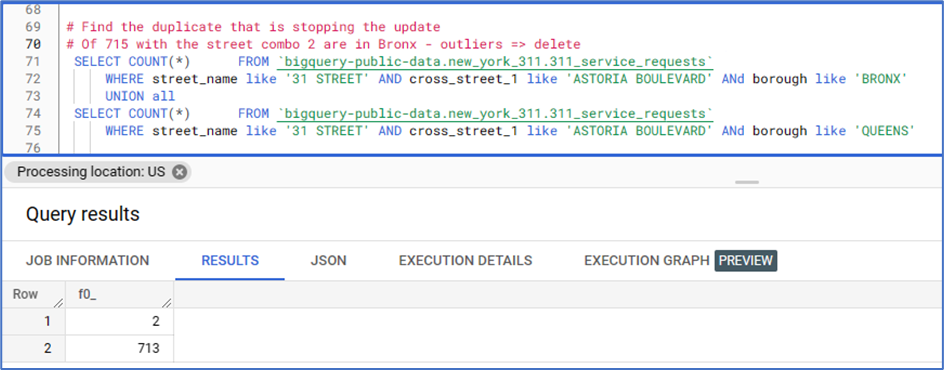

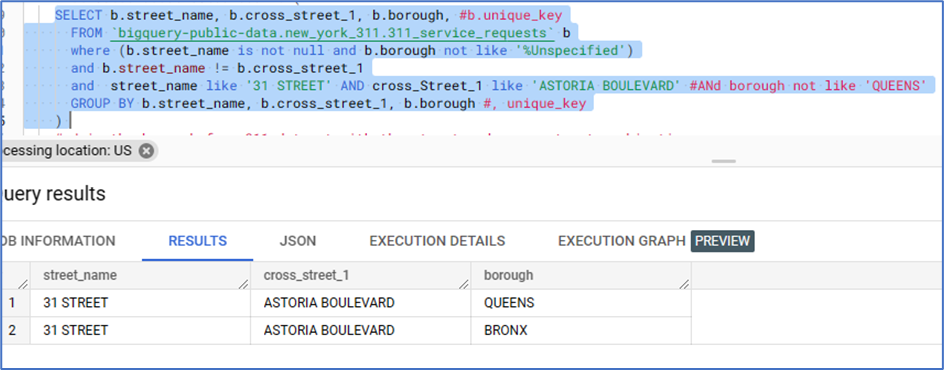

In [ ]:
 #bUT OTHERS likely overlap 2 boroughs such as
  SELECT COUNT(*)      FROM `bigquery-public-data.new_york_311.311_service_requests`
      WHERE street_name like 'BROADWAY' AND cross_street_1 like 'WEST 225 STREET' ANd borough like 'MANHATTAN'
      UNION all
  SELECT COUNT(*)      FROM `bigquery-public-data.new_york_311.311_service_requests`
       WHERE street_name like 'BROADWAY' AND cross_street_1 like 'WEST 225 STREET' ANd borough like 'BRONX'


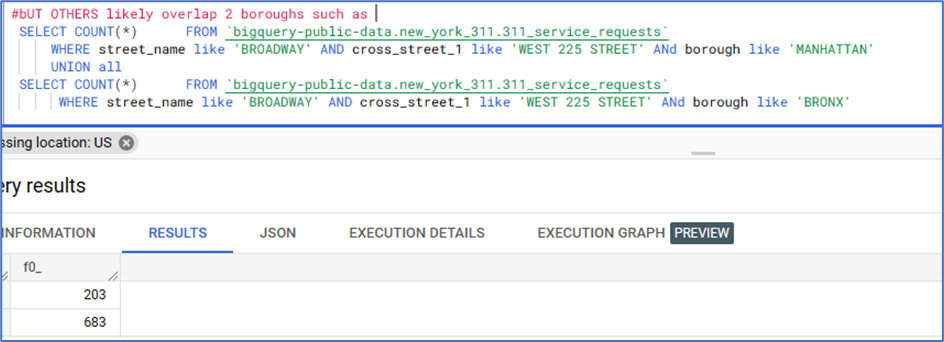

Then 203 and 683 so valid overlapping areas.



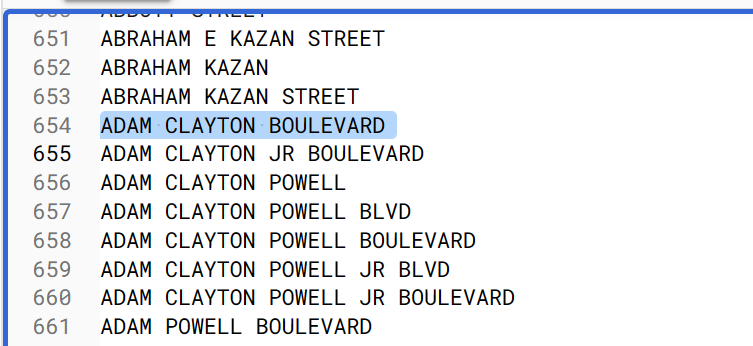

### Traffic volume counts

We note that there is also data on traffic volumes but following a brief assessment opted to not include this data. https://data.cityofnewyork.us/Transportation/Automated-Traffic-Volume-Counts/7ym2-wayt

https://data.cityofnewyork.us/Transportation/Traffic-Volume-Counts/btm5-ppia

Each row of this dataset is a traffic volume count for each hour.

## **Create and export initial collisions dataset**


An initial dataset was created and export to a table in BigQuery so that DDL queries would be possible.

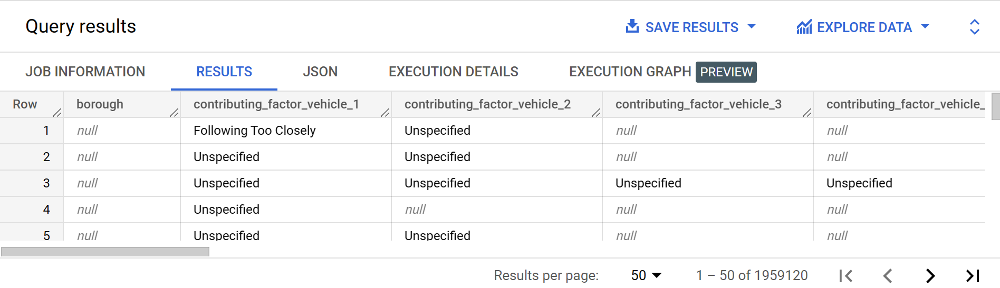

## **Collecting the raw weather data**
There are 137 stations in New York state.

In [ ]:
Select * from `bigquery-public-data.noaa_gsod.stations` where  country = 'US' and state = 'NY'

From the initial set we isolate the variants relating to **New York Central Park**.

In [ ]:
Select * from `bigquery-public-data.noaa_gsod.stations` where  country = 'US' and state = 'NY' and (name  like 'NYC CENTRAL%' OR name like 'NEW YORK CENTRAL%') ORDER BY WBAN

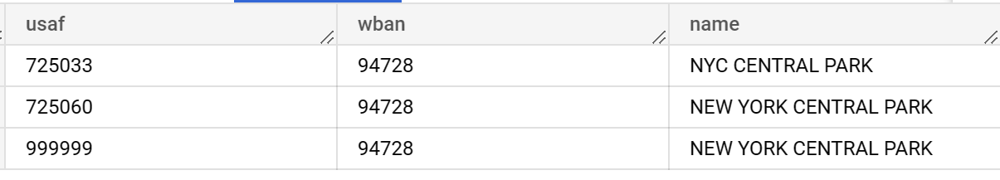

## **Create a view to get the weather data for 2012 to 2023**

Information about the Global Summary of the day and field names and values is available on the [National Centers for Environmental Information web site](https://www.ncei.noaa.gov/access/metadata/landing-page/bin/iso?id=gov.noaa.ncdc:C00516).

We create a new view for the weather data between 2012 and 2023.
We convert the numeric and string based missing values to null (9999.9, "999.9" etc).

We will disregard some columns such as tornado funnel cloud as no values have been reported for New York City.



In [ ]:
CREATE VIEW `uhiproject-363220.Assignment1DS.nyc_weather_2012_2023` AS
  SELECT
  -- Create a timestamp from the date components.
  -- timestamp(concat(year,"-",mo,"-",da)) as timestamp,-- Timestamp alternative
  DATE (CAST(year AS int64), CAST(mo AS INT64), CAST(da as INT64)) as Date, --Date alternative
  stn, wban, year, mo as mm, da as dd,
  -- Replace numerical missing values with nulls
  AVG(IF (dewp=9999.9, null, dewp)) AS dewp,
  AVG(IF (slp=9999.9, null, slp)) AS slp, --- 9999.9 = missing
  AVG(IF (mxpsd="999.9", null, CAST(mxpsd AS Float64))) AS mxpsd,
  AVG(IF (max=9999.9, null, max)) AS max,
  AVG(IF (min=9999.9, null, min)) AS min,
  AVG(cast(fog AS FLOAT64)) AS fog, --- 0 = missing or no recording
  AVG(IF (temp=9999.9, null, temp)) AS temperature, -- 9999.9 = missing
  AVG(IF (visib=999.9, null, visib)) AS visibility, -- 999.9 = Missing
  AVG(IF (wdsp="999.9", null, CAST(wdsp AS Float64))) AS wind_speed, ---999.9 = missing
  AVG(IF (gust=999.9, null, gust)) AS gust, -- 999.9 = missing
  AVG(IF (prcp=99.99, null, prcp)) AS precipitation, --- 99.9 = missing
  AVG(IF (sndp=999.9, null, sndp)) AS snow_depth, --- 999.9 = missing
  AVG(cast(thunder AS FLOAT64)) AS thunder, --- 0 = missing or no recording
  AVG(cast(hail AS FLOAT64)) AS hail, --- 0 = missing or no recording
  AVG(cast(snow_ice_pellets AS FLOAT64)) AS snow_ice_pellets --- 0 = missing or no recording
FROM
  `bigquery-public-data.noaa_gsod.gsod20*`
WHERE
  _TABLE_SUFFIX BETWEEN '12' AND '23'
  #CAST(YEAR AS INT64) BETWEEN 2022 AND 2022 -- ALternative
  AND wban = '94728' -- NYC Central Park
GROUP BY Date, stn, wban, year, mo, da
ORDER BY Date


In [ ]:
CREATE VIEW `uhiproject-363220.Assignment1DS.nyc_weather_2012_2023` AS
SELECT
  -- Create a timestamp from the date components.
  -- timestamp(concat(year,"-",mo,"-",da)) as timestamp,-- Timestamp alternative
  DATE (CAST(year AS int64), CAST(mo AS INT64), CAST(da as INT64)) as Date, --Date alternative
  stn, wban, year, mo as mm, da as dd,
  -- Replace numerical missing values with nulls
  IF (dewp=9999.9, null, dewp) AS dewp,
  IF (slp=9999.9, null, slp) AS slp, --- 9999.9 = missing
  IF (mxpsd="999.9", null, CAST(mxpsd AS Float64)) AS mxpsd,
  IF (max=9999.9, null, max) AS max,
  IF (min=9999.9, null, min) AS min,
  cast(fog AS FLOAT64) AS fog, --- 0 = missing or no recording
  IF (temp=9999.9, null, temp) AS temperature, -- 9999.9 = missing
  IF (visib=999.9, null, visib) AS visibility, -- 999.9 = Missing
  IF (wdsp="999.9", null, CAST(wdsp AS Float64)) AS wind_speed, ---999.9 = missing
  IF (gust=999.9, null, gust) AS gust, -- 999.9 = missing
  IF (prcp=99.99, null, prcp) AS precipitation, --- 99.9 = missing
  IF (sndp=999.9, null, sndp) AS snow_depth, --- 999.9 = missing
  cast(thunder AS FLOAT64) AS thunder, --- 0 = missing or no recording
  cast(hail AS FLOAT64) AS hail, --- 0 = missing or no recording
  cast(snow_ice_pellets AS FLOAT64) AS snow_ice_pellets --- 0 = missing or no recording
FROM
  `bigquery-public-data.noaa_gsod.gsod20*`
WHERE
  _TABLE_SUFFIX BETWEEN '12' AND '23'
  #CAST(YEAR AS INT64) BETWEEN 2022 AND 2022 -- ALternative
  AND wban = '94728' -- NYC Central Park
GROUP BY Date, dewp, stn, wban, year, mo, da, slp, mxpsd, max, min, fog,thunder, hail, snow_ice_pellets, snow_depth,  precipitation, temperature, visibility, wdsp, gust
ORDER BY Date

The data appears ok viewing a sample.

As an aside, Jung interpolates weather data from the 3 closest weather stations to reflect geometrical and temporal variety in a study of weather and crash intensity. (Jung, 2009).

In [ ]:
select * from `uhiproject-363220.Assignment1DS.nyc_weather_2012_2023`  limit 100

In [ ]:
select count(*) from `uhiproject-363220.Assignment1DS.nyc_weather_2012_2023`

There are 4018 records which is correct for the range of years (366 * 3) + (8 * 365) up to end of 2022 and additional days from 2023.

###Find the closest weather station as a source for missing values

In [ ]:
## Slightly modified from Holmquist's query in 'Finding the Closest Weather Stations BigQuery Public Datasets'
## At https://cloud-jake.medium.com/finding-the-closest-weather-stations-bigquery-public-datasets-eac029471d12
## -- Get nearest weather station by geo coordinates
with my_location as (
  SELECT  ST_GEOGPOINT(-73.969, 40.779) as my_location,
          'NYC Central Park Station' as home
), stations as (
  SELECT *, ST_GEOGPOINT(lon,lat) as latlon_geo
  FROM `bigquery-public-data.noaa_gsod.stations`
)
--
    SELECT ST_ASTEXT(my_location) as my_location,
           home,
           ARRAY_AGG( # get the closest station
              STRUCT(usaf,wban,name,lon,lat,country,state,
                    ST_DISTANCE(my_location, b.latlon_geo)*0.00062137 as miles)
           ) as stations
    FROM my_location a, stations b
    WHERE ST_DWITHIN(my_location, b.latlon_geo, 16093)  --meters = 10 miles approx
    GROUP BY my_location, home

We can identify La Guardia airport as being the best candidate as an official station under 5 miles away based on geolocation.

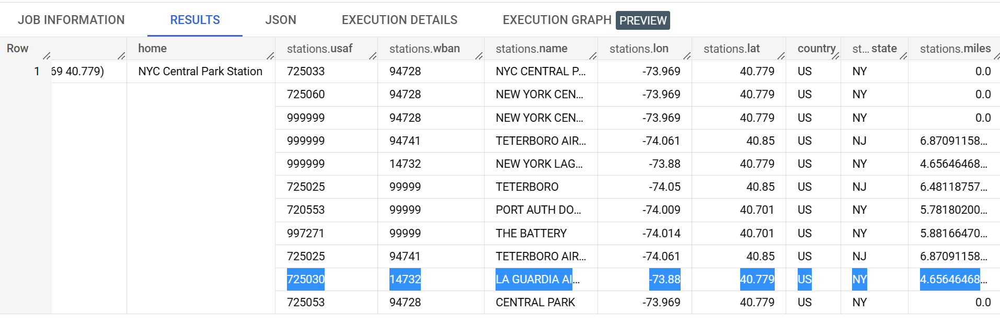

### Wind speed

There are 227 null wind speed values. We replaced all 227 null wind speed values with the value from the closest weather station.

In [ ]:
# Create a view to join the nnon-null wind speed values from the nearest weather station LA Guardia
CREATE VIEW `uhiproject-363220.Assignment1DS.weather_replace_wind_speed` AS
  (SELECT
    DATE (CAST(a.year AS int64), CAST(a.mo AS INT64), CAST(a.da as INT64)) as DateA, --Date alternative
   b.date,
   wind_speed,
   CAST(wdsp AS Float64) as wdsp,
  FROM `bigquery-public-data.noaa_gsod.gsod20*` a,
  `uhiproject-363220.Assignment1DS.nyc_weather_2012_2023` b
  where
   (a.wdsp is not null  and a.wdsp != '999.9')
   and
   (DATE (CAST(a.year AS int64), CAST(a.mo AS INT64), CAST(a.da as INT64)) = b.date)
  and a.wban = '14732' -- La Guardia
  and b.wind_speed is null --order by a.date
  )

In [ ]:
# Update the null wind speed values vased on the values from the La Guardia airport
update `uhiproject-363220.Assignment1DS.nyc_weather_2012_2023` a
set a.wind_speed = b.wdsp
from `uhiproject-363220.Assignment1DS.weather_replace_wind_speed` b
where a.date = b.date and a.wind_speed is null

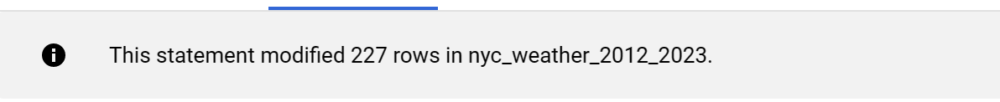

### Precipitation
We can replace the null values based on the values from the nearby La Guardia airport station.

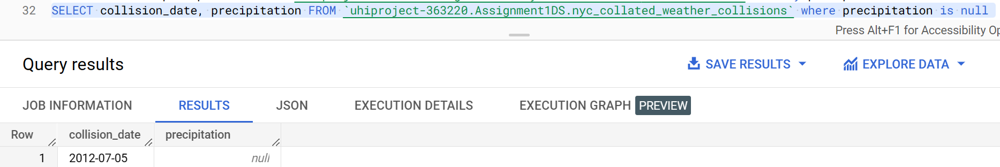

In [ ]:
## Older version - delete
# Find the precipitation from the nearby La Guardia weather station for the null value
  SELECT DATE (CAST(year AS int64), CAST(mo AS INT64), CAST(da as INT64)) as Date, --Date alternative
  stn, prcp
  FROM `bigquery-public-data.noaa_gsod.gsod20*`
WHERE
  _TABLE_SUFFIX LIKE '12' # likely more efficient
  #CAST(YEAR AS INT64) = 2012
  AND wban = '14732' -- LA GUARDIA AIRPORT
  AND da = '05' and mo = '07'

In [ ]:
# Create a view to join the non-null wind speed values from the nearest weather station LA Guardia
CREATE VIEW `uhiproject-363220.Assignment1DS.weather_replace_precipitation` AS
  (SELECT
    DATE (CAST(a.year AS int64), CAST(a.mo AS INT64), CAST(a.da as INT64)) as DateA, --Date alternative
   b.date,
   precipitation,
   prcp,
  FROM `bigquery-public-data.noaa_gsod.gsod20*` a,
  `uhiproject-363220.Assignment1DS.nyc_weather_2012_2023` b
  where
   (a.prcp is not null) #  and a.prcp != 999.9)
   and
   (DATE (CAST(a.year AS int64), CAST(a.mo AS INT64), CAST(a.da as INT64)) = b.date)
  and a.wban = '14732' -- La Guardia
  and b.precipitation is null
  )

  # Update the null precipitation values vased on the values from the La Guardia airport
update `uhiproject-363220.Assignment1DS.nyc_weather_2012_2023` a
set a.precipitation = b.prcp
from `uhiproject-363220.Assignment1DS.weather_replace_precipitation` b
where a.date = b.date and a.precipitation is null

###Temperature, dewp, min, max, fog, thunder, hail, snow and ice pellets.

These items have no null values.

### Temperature

There are no missing or null values in the temperature column.

### Visibility

We replaced all 34 null visibility with values from the La Guardia station.

In [ ]:
# Create a view to join the non-null visibility values from the nearest weather station LA Guardia
select distinct visibility from `uhiproject-363220.Assignment1DS.nyc_weather_2012_2023` order by visibility
where temperature is null

# Create a view to join the nnon-null visibiliyt values from the nearest weather station LA Guardia
CREATE VIEW `uhiproject-363220.Assignment1DS.weather_replace_visibility` AS
  (SELECT
    DATE (CAST(a.year AS int64), CAST(a.mo AS INT64), CAST(a.da as INT64)) as DateA, --Date alternative
   b.date, visibility, visib,
  FROM `bigquery-public-data.noaa_gsod.gsod20*` a,
  `uhiproject-363220.Assignment1DS.nyc_weather_2012_2023` b
  where
   (a.visib is not null)
   and
   (DATE (CAST(a.year AS int64), CAST(a.mo AS INT64), CAST(a.da as INT64)) = b.date)
  and a.wban = '14732' -- La Guardia
  and b.visibility is null
  )

# Update the null visibility values vased on the values from the La Guardia airport
update `uhiproject-363220.Assignment1DS.nyc_weather_2012_2023` a
set a.visibility = b.visib
from `uhiproject-363220.Assignment1DS.weather_replace_visibility` b
where a.date = b.date and a.visibility is null

### Mean sea level pressure for the day in millibars

Using the same method we replaced all 24 null values for slp based on the values from the nearby La Guardia station.

###Mxpsd                       

In [ ]:
select mxpsd from `uhiproject-363220.Assignment1DS.nyc_weather_2012_2023` where mxpsd is null
select distinct mxpsd from `uhiproject-363220.Assignment1DS.nyc_weather_2012_2023` order by mxpsd

# Create a view to join the non-null mxpsd values from the nearest weather station LA Guardia
CREATE VIEW `uhiproject-363220.Assignment1DS.weather_replace_mxpsd` AS
  (SELECT
    DATE (CAST(a.year AS int64), CAST(a.mo AS INT64), CAST(a.da as INT64)) as DateA, --Date alternative
   b.date, cast(a.mxpsd as Float64) as mxpsd #, b.mxpsd as nycp_null_mxpsd
  FROM `bigquery-public-data.noaa_gsod.gsod20*` a,
  `uhiproject-363220.Assignment1DS.nyc_weather_2012_2023` b
  where
   (a.mxpsd is not null and a.mxpsd !="999.9")
   and
   (DATE (CAST(a.year AS int64), CAST(a.mo AS INT64), CAST(a.da as INT64)) = b.date)
  and a.wban = '14732' -- La Guardia
  and b.mxpsd is null
  )

select * from `uhiproject-363220.Assignment1DS.weather_replace_mxpsd`

# Update the null values vased on the values from the La Guardia airport
update `uhiproject-363220.Assignment1DS.nyc_weather_2012_2023` a
set a.mxpsd = b.mxpsd
from `uhiproject-363220.Assignment1DS.weather_replace_mxpsd` b
where a.date = b.date and a.mxpsd is null

### Gust

We can replace 896 null values for gust using the same method.

In [ ]:
## gust
select * from `uhiproject-363220.Assignment1DS.nyc_weather_2012_2023` where gust is null

# Create a view to join the non-null gust values from the nearest weather station LA Guardia
CREATE VIEW `uhiproject-363220.Assignment1DS.weather_replace_gust` AS
  (SELECT
    DATE (CAST(a.year AS int64), CAST(a.mo AS INT64), CAST(a.da as INT64)) as DateA, --Date alternative
   b.date, cast(a.gust as Float64) as gust
  FROM `bigquery-public-data.noaa_gsod.gsod20*` a,
  `uhiproject-363220.Assignment1DS.nyc_weather_2012_2023` b
  where
   (a.gust is not null and a.gust !=999.9)
   and
   (DATE (CAST(a.year AS int64), CAST(a.mo AS INT64), CAST(a.da as INT64)) = b.date)
  and a.wban = '14732' -- La Guardia
  and b.gust is null
  )

select * from `uhiproject-363220.Assignment1DS.weather_replace_gust`

# Update the null values vased on the values from the La Guardia airport
update `uhiproject-363220.Assignment1DS.nyc_weather_2012_2023` a
set a.gust = b.gust
from `uhiproject-363220.Assignment1DS.weather_replace_gust` b
where a.date = b.date and a.gust is null

###Snow depth

Fow snow depth, we can replace 88 out of 3900 null and originally missing now depth values with value form the nearby La Guardia airport station.

In [ ]:
## snow depth
select * from `uhiproject-363220.Assignment1DS.nyc_weather_2012_2023` where snow_depth is null

# Create a view to join the non-null snow_depth values from the nearest weather station LA Guardia
CREATE VIEW `uhiproject-363220.Assignment1DS.weather_replace_snow_depth` AS
  (SELECT
    DATE (CAST(a.year AS int64), CAST(a.mo AS INT64), CAST(a.da as INT64)) as DateA, --Date alternative
   b.date, cast(a.sndp as Float64) as snow_depth
  FROM `bigquery-public-data.noaa_gsod.gsod20*` a,
  `uhiproject-363220.Assignment1DS.nyc_weather_2012_2023` b
  where
   (a.sndp is not null and a.sndp !=999.9)
   and
   (DATE (CAST(a.year AS int64), CAST(a.mo AS INT64), CAST(a.da as INT64)) = b.date)
  and a.wban = '14732' -- La Guardia
  and b.snow_depth is null
  )

select * from `uhiproject-363220.Assignment1DS.weather_replace_snow_depth`

# Update the null values vased on the values from the La Guardia airport
update `uhiproject-363220.Assignment1DS.nyc_weather_2012_2023` a
set a.snow_depth = b.snow_depth
from `uhiproject-363220.Assignment1DS.weather_replace_snow_depth` b
where a.date = b.date and a.snow_depth is null

## **View to count collisions by year**

In [ ]:
## view to count the collisions by year
CREATE VIEW `uhiproject-363220.Assignment1DS.nypd_daily_collisions_by_year`
AS SELECT
#CAST (timestamp as DATE) AS collision_date, avg(CAST (FORMAT_DATE("%u", timestamp)AS NUMERIC)) as day,
extract (Year from timestamp) as Year,
COUNT(CAST(TIMESTAMP as DATE)) AS NUM_COLLISIONS,
sum(number_of_persons_injured) as injured, sum(number_of_persons_killed) as fatalities,
ROUND(sum(weighted_fatalities_injuries),2) as weighted_fatalities_injuries,
sum(num_vehicles_involved) as num_vehicles_involved,
FROM `uhiproject-363220.Assignment1DS.nypd_mv_collisions`
##`bigquery-public-data.new_york_mv_collisions.nypd_mv_collisions`
##  where EXTRACT(YEAR FROM timestamp) <= 2023
GROUP BY Year
order by Year

In [ ]:
select * from `uhiproject-363220.Assignment1DS.nypd_daily_collisions_by_year`

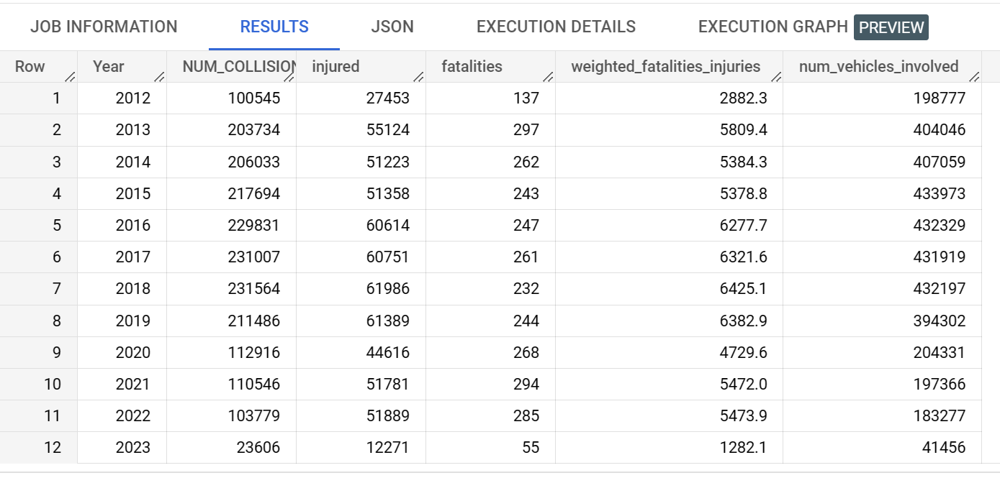

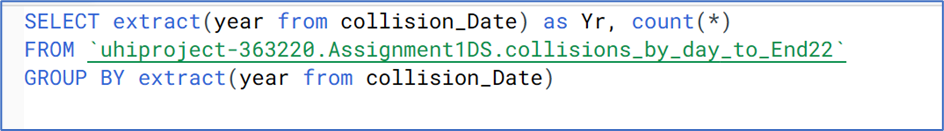

## **View to count collisions by day and indicate the day of the week**

Create a view to count the collisions by day and indicate the day of the week.
The segment CAST (FORMAT_DATE("%u", timestamp)AS NUMERIC) as day indicates the day of the week (Monday=1 and so on).


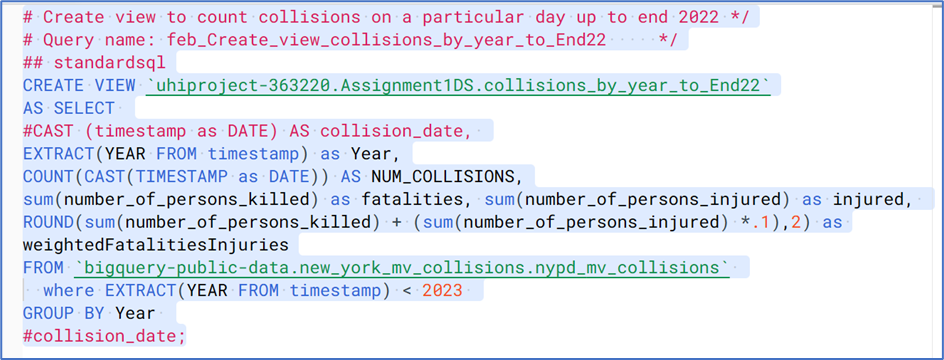

In [ ]:
## view to count the collisions by day and indicate the day of the week
CREATE VIEW `uhiproject-363220.Assignment1DS.nypd_daily_collisions_with_weekday`
AS SELECT CAST (timestamp as DATE) AS collision_date, avg(CAST (FORMAT_DATE("%u", timestamp)AS NUMERIC)) as day,
COUNT(CAST(TIMESTAMP as DATE)) AS NUM_COLLISIONS,
sum(number_of_persons_injured) as injured, sum(number_of_persons_killed) as fatalities,
ROUND(sum(weighted_fatalities_injuries),2) as weighted_fatalities_injuries, sum(num_vehicles_involved) as num_vehicles_involved,
FROM `uhiproject-363220.Assignment1DS.nypd_mv_collisions`
##`bigquery-public-data.new_york_mv_collisions.nypd_mv_collisions`
##  where EXTRACT(YEAR FROM timestamp) <= 2022
GROUP BY collision_date
order by collision_date

In [ ]:
select * from `uhiproject-363220.Assignment1DS.nypd_daily_collisions_with_weekday`

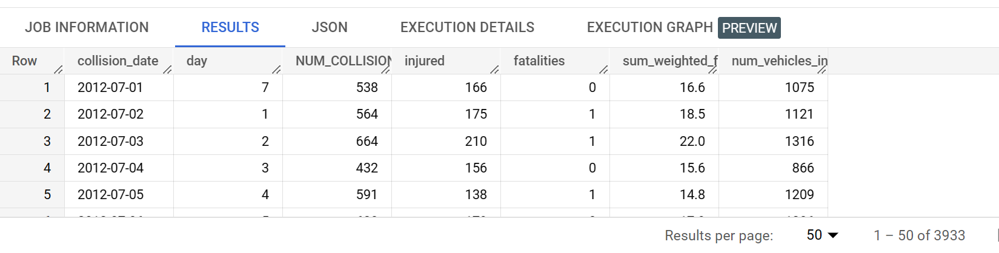

There are 3933 records; there is a discrepancy between the weather data set which has data for the full complement of days in the range.

In [ ]:
select COUNT(*) from `uhiproject-363220.Assignment1DS.nypd_daily_collisions_with_weekday`

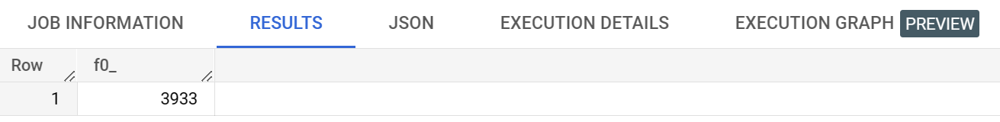

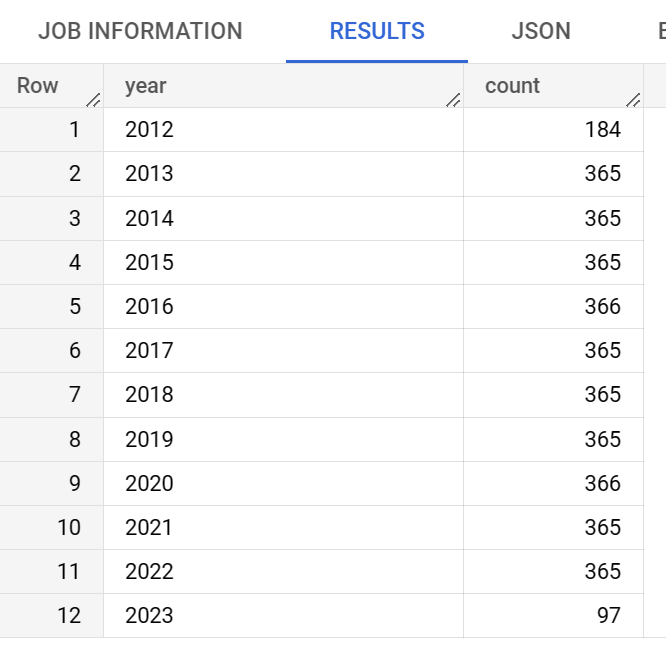

In [ ]:
#Check the correct number of days returned for each year
select extract(year from collision_DAte) as Yr, count(*) from
uhiproject-363220.Assignment1DS.nypd_daily_collision_with_weekday
group by extract(year from collision_date)

Figure 39: Tally of records by year is correct

## **Collate the weather and collision data to a new table**

We collated the total collisions by day with the GSOD data for the day.

In [ ]:
# Collate the weather and collision data to a new table
## was view
CREATE TABLE `uhiproject-363220.Assignment1DS.nyc_collated_weather_collisions`
AS SELECT ##dewp, slp, visib, wdsp, mxpsd, gust, max, min, prcp, sndp, fog, NUM_COLLISIONS
collision_date, day, dd, year, mm, num_collisions, fatalities, injured,
weighted_fatalities_injuries,dewp, slp, mxpsd, max,min, fog, temperature,
visibility, wind_speed, gust, precipitation, snow_depth, thunder, hail, snow_ice_pellets
from
 `uhiproject-363220.Assignment1DS.nyc_weather_2012_2023` as weather, # View
 `uhiproject-363220.Assignment1DS.nypd_daily_collisions_with_weekday` as collisions # view
 where collisions.collision_date = weather.date
 ORDER BY collisions.collision_date

In [ ]:
# Collate the weather and collision data to a new table
## was view
CREATE view `uhiproject-363220.Assignment1DS.nyc_collated_weather_collisions_by_date`
AS SELECT ##dewp, slp, visib, wdsp, mxpsd, gust, max, min, prcp, sndp, fog, NUM_COLLISIONS
collision_date, day, dd, year, mm, num_collisions, fatalities, injured,
weighted_fatalities_injuries,dewp, slp, mxpsd, max,min, fog, temperature,
visibility, wind_speed, gust, precipitation, snow_depth, thunder, hail, snow_ice_pellets
from
 `uhiproject-363220.Assignment1DS.nyc_weather_2012_2023` as weather, # View
 `uhiproject-363220.Assignment1DS.nypd_daily_collisions_with_weekday` as collisions # view
 where collisions.collision_date = weather.date
 ORDER BY collisions.collision_date

In [ ]:
# Collate the weather and collision data to a new table
## was view
CREATE view `uhiproject-363220.Assignment1DS.nyc_collated_weather_collisions_by_date`
AS SELECT ##dewp, slp, visib, wdsp, mxpsd, gust, max, min, prcp, sndp, fog, NUM_COLLISIONS
collision_date, day, dd, year, mm, num_collisions, fatalities, injured,
weighted_fatalities_injuries,dewp, slp, mxpsd, max,min, fog, temperature,
visibility, wind_speed, gust, precipitation, snow_depth, thunder, hail, snow_ice_pellets
from
 `uhiproject-363220.Assignment1DS.nyc_weather_2012_2023` as weather, # View
 `uhiproject-363220.Assignment1DS.nypd_daily_collisions_with_weekday` as collisions # view
 where collisions.collision_date = weather.date
 ORDER BY collisions.collision_date

#### Tally the records by year to ensure we have the correct number of records.

We check that the we have correct number of records for each year.

In [ ]:
## Check the count of records for each year
SELECT year, count(*) as count FROM `uhiproject-363220.Assignment1DS.nyc_collated_weather_collisions` where year like '2012' group by year
union all
SELECT year, count(*)  as count FROM `uhiproject-363220.Assignment1DS.nyc_collated_weather_collisions` where year like '2013' group by year
union all
SELECT year, count(*) as count FROM `uhiproject-363220.Assignment1DS.nyc_collated_weather_collisions` where year like '2014' group by year
union all
SELECT year, count(*) as count FROM `uhiproject-363220.Assignment1DS.nyc_collated_weather_collisions` where year like '2015' group by year
union all
SELECT year, count(*) as count FROM `uhiproject-363220.Assignment1DS.nyc_collated_weather_collisions` where year like '2016' group by year
union all
SELECT year, count(*) as count FROM `uhiproject-363220.Assignment1DS.nyc_collated_weather_collisions` where year like '2017' group by year
union all
SELECT year, count(*) as count FROM `uhiproject-363220.Assignment1DS.nyc_collated_weather_collisions` where year like '2018' group by year
union all
SELECT year, count(*) as count FROM `uhiproject-363220.Assignment1DS.nyc_collated_weather_collisions` where year like '2019' group by year
union all
SELECT year, count(*) as count FROM `uhiproject-363220.Assignment1DS.nyc_collated_weather_collisions` where year like '2020' group by year
union all
SELECT year, count(*) as count FROM `uhiproject-363220.Assignment1DS.nyc_collated_weather_collisions` where year like '2021' group by year
union all
SELECT year, count(*) as count FROM `uhiproject-363220.Assignment1DS.nyc_collated_weather_collisions` where year like '2022'group by year
union all
SELECT year, count(*) as count FROM `uhiproject-363220.Assignment1DS.nyc_collated_weather_collisions` where year like '2023'  group by year
order by year asc

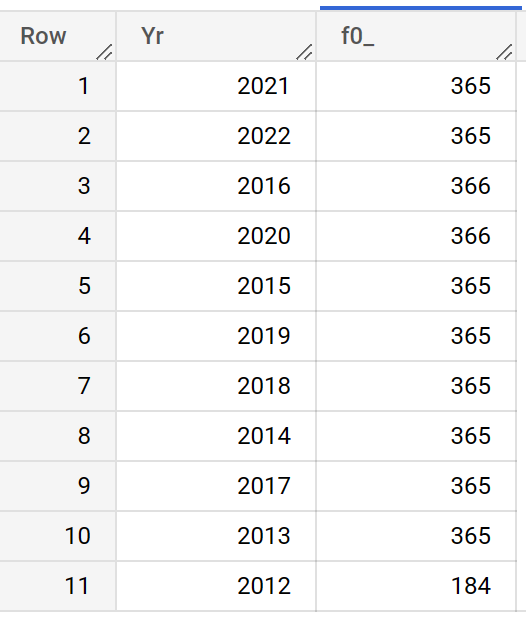

## View to count collisions by borough by day and indicate the day of the week


In [ ]:
## view to count the collisions by borough by day and indicate the day of the week
CREATE VIEW `uhiproject-363220.Assignment1DS.nypd_daily_collisions_by_borough_with_weekday`
AS SELECT CAST (timestamp as DATE) AS collision_date, avg(CAST (FORMAT_DATE("%u", timestamp)AS NUMERIC)) as day, borough,
COUNT(CAST(TIMESTAMP as DATE)) AS NUM_COLLISIONS,
sum(number_of_persons_injured) as injured, sum(number_of_persons_killed) as fatalities,
ROUND(sum(weighted_fatalities_injuries),2) as weighted_fatalities_injuries, sum(num_vehicles_involved) as num_vehicles_involved,
FROM `uhiproject-363220.Assignment1DS.nypd_mv_collisions`
##`bigquery-public-data.new_york_mv_collisions.nypd_mv_collisions`
##  where EXTRACT(YEAR FROM timestamp) <= 2022
GROUP BY collision_date, borough
order by collision_date

This is a sample of the results and schema.
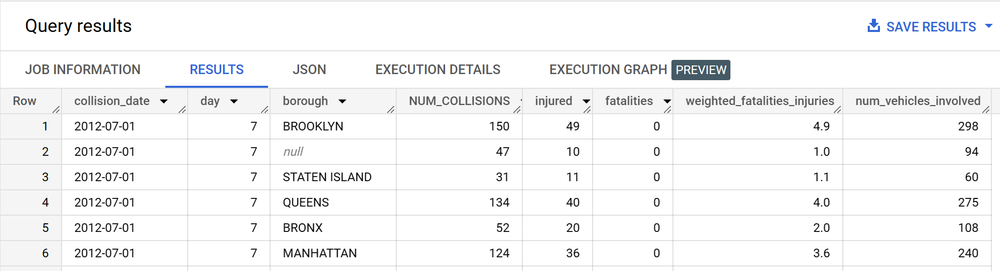

## Collate collisions and weather by borough



In [ ]:
#DID NOT DO THIS YET - WOULD BE SOTRING WEATHER DATA 6 TIMES FOR EACH DAY... AND ALREADY HAVE THE DATA IN THE COLLATED WEATHER DATA...
# Collate the weather and collision data to a new table
CREATE TABLE `uhiproject-363220.Assignment1DS.nyc_collated_weather_collisions_by_borough`
AS SELECT ##dewp, slp, visib, wdsp, mxpsd, gust, max, min, prcp, sndp, fog, NUM_COLLISIONS
collision_date, day, dd, year, mm, num_collisions, fatalities, injured,
weighted_fatalities_injuries,dewp, slp, mxpsd, max,min, fog, temperature,
visibility, wind_speed, gust, precipitation, snow_depth, thunder, hail, snow_ice_pellets
from
 `uhiproject-363220.Assignment1DS.nyc_weather_2012_2023` as weather, # View
 `uhiproject-363220.Assignment1DS.nypd_daily_collisions_by_borough_with_weekday` as collisions # view
 where collisions.collision_date = weather.date
 ORDER BY collisions.collision_date

## Create a second collision dataset for creating map visualisations

We will exclude some columns from this collisions based on the analysis thus far and will focus on more useful data. This table is for the purposes of visualising collision locations.

In [ ]:
# Create a new collisions table excluding some columns that we will not be visualizing
create table `uhiproject-363220.Assignment1DS.nypd_mv_collisions_export` as
select * except(borough_from_311, contributing_factor_vehicle_2, cross_street_name, on_street_name, off_street_name, location,zip_code, vehicle_type_code2) from `uhiproject-363220.Assignment1DS.nypd_mv_collisions`
where EXTRACT(YEAR FROM timestamp) > 2020

In the next part of the assignment, we will analyse the data in R.

# References
* Yung, S. 2009, 'Injury Severity of multi-vehicle crash in rainy weather'
available online at https://files.topslab.wisc.edu/publications/2010/INJURY%20SEVERITY%20OF%20MULTI-VEHICLE%20CRASH%20IN%20RAINY%20WEATHER%20(10-4056).pdf


* City of New York, 311 Service Requests from 2010 to Present, available online at https://data.cityofnewyork.us/Social-Services/311-Service-Requests-from-2010-to-Present/erm2-nwe9, accessed January 2023

* City of New York, 'Street Name Dictionary', available online at https://data.cityofnewyork.us/City-Government/Street-Name-Dictionary/w4v2-rv6b?category=City-Government&view_name=Street-Name-Dictionary

BYTES of the BIG APPLE™ Street Name Dictionary (SND)

* New York State Department of Motor Vehicles, 'Police accident report MV -104AN', available online at https://www.nhtsa.gov/sites/nhtsa.gov/files/documents/ny_overlay_mv-104an_rev05_2004.pdf, accessed January 2023

*





